In [1]:
# Importing useful libraries
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from datetime import datetime
import scipy.stats.mstats as mstats


In [2]:
import seaborn as sns
sns.set_style("dark")
sns.set()

In [3]:
from IPython.display import display, HTML

display(HTML(data="""
<style>
    div#notebook-container    { width: 75%; }
    div#menubar-container     { width: 75%; }
    div#maintoolbar-container { width: 79%; }
</style>
"""))

In [4]:
%%javascript
IPython.OutputArea.auto_scroll_threshold = 9999

<IPython.core.display.Javascript object>

In [5]:
from IPython.display import Markdown, display
def printmd(string):
    display(Markdown(string))

## Loading Data

In [6]:
mask_data = pd.read_csv('mask.csv')
exp_data = pd.read_csv('experiment_list.csv')

OD_data = pd.read_csv('OD.csv')
GFP_data = pd.read_csv('GFP.csv')
RFP_data = pd.read_csv('RFP.csv')


t_min = 0
t_max = 800 


## 1 - Plotting Data

### 1.1 - We group the experiments 

In [7]:
# slicing frames
# Group 1 : Controls
# Other Groups correspond to strain

control_exps = exp_data[(exp_data['Name'].notnull()) & (exp_data['Strain'].isnull())][['Name', 'Label', 'Strain','Plasmid','IPTG', 'Arabinose']].drop_duplicates()
control_exps.sort_values(by=['Name'], inplace=True)
# NB: drop duplicates is a mere precaution; we do not expect duplicates

non_control_exps = exp_data[(exp_data['Name'].notnull()) & (exp_data['Strain'].notnull())][['Name', 'Label', 'Strain','Plasmid','IPTG', 'Arabinose']].drop_duplicates()
non_control_exps.sort_values(by=['Strain','Plasmid','Name'], inplace=True)
# We could split this group further , eg by strain but it would create a strcutre that is too deep
# Best split the group / strain & plasmid when we display the results


# creating dicts as it will be easier to iterate over (iterating over rows of a frame is an antipattern)
controls = [{"Name":name,"Label":label,"Strain":strain,"Plasmid":plasmid,"IPTG":iptg,"Ara":ara} 
            for name,label,strain,plasmid,iptg,ara 
            in zip(control_exps['Name'],control_exps['Label'],control_exps['Strain'],control_exps['Plasmid'],control_exps['IPTG'],control_exps['Arabinose'])]
non_controls = [{"Name":name,"Label":label,"Strain":strain,"Plasmid":plasmid,"IPTG":iptg,"Ara":ara} 
            for name,label,strain,plasmid,iptg,ara 
            in zip(non_control_exps['Name'],non_control_exps['Label'],non_control_exps['Strain'],non_control_exps['Plasmid'],non_control_exps['IPTG'],non_control_exps['Arabinose'])]



## 1.2 We plot the data for the controls

<span style='font-size:200%;font-weight:900'><br>Plotting the controls</span>

<div style='background-color:#4682B4;width:100%;height:20px;'></div>

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>BLK (Blank Well)</span>

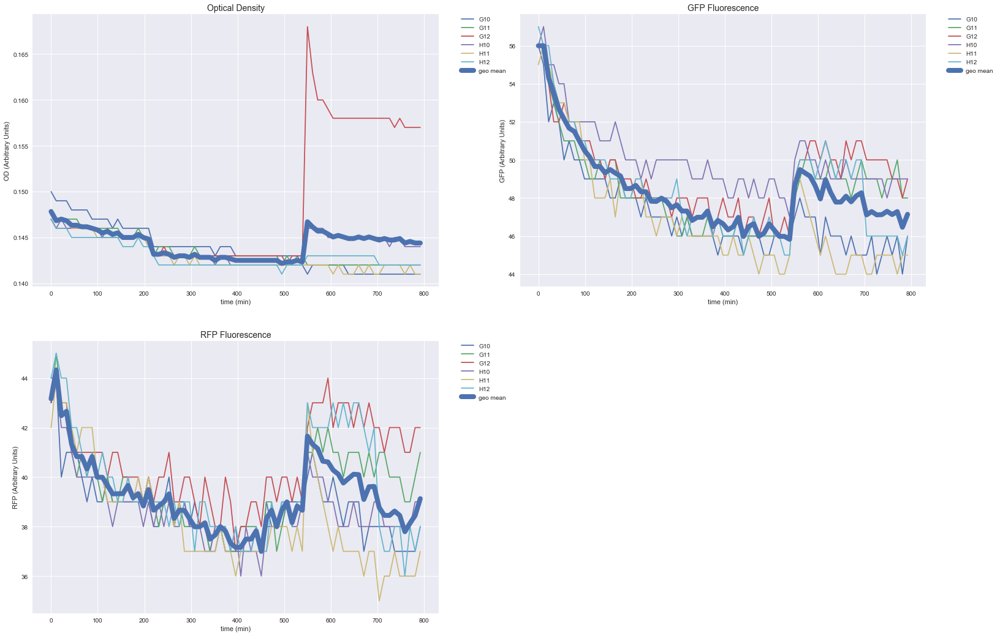

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>MED (Media Only)</span>

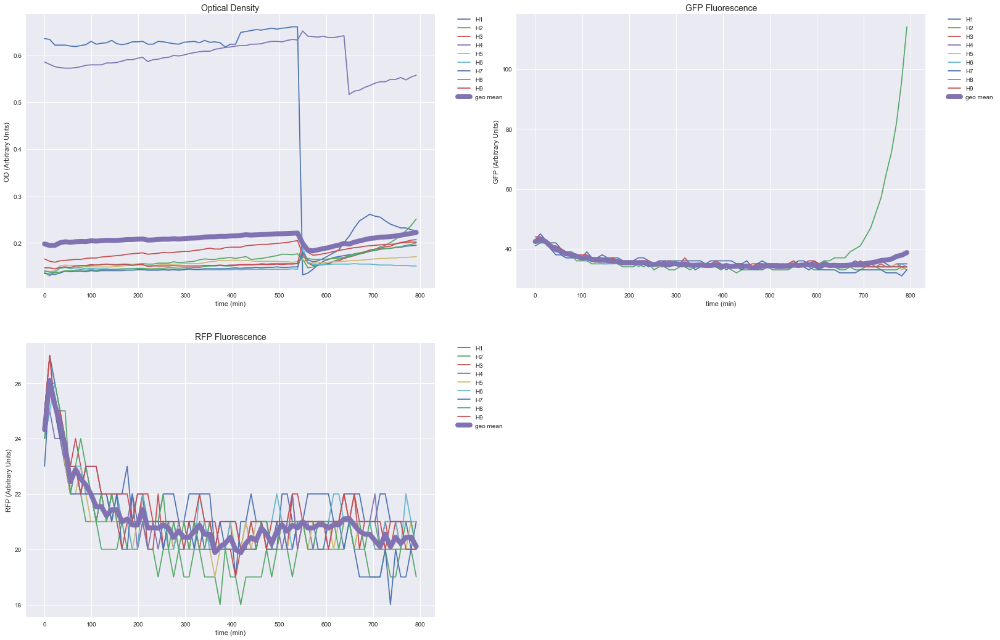

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

In [8]:
printmd("<span style='font-size:200%;font-weight:900'><br>Plotting the controls</span>")
printmd("<div style='background-color:#4682B4;width:100%;height:20px;'></div>")
    

for control in controls:
    
    printmd("<div style='background-color:#4682B4;width:100%;height:10px;'></div>")
    
    # from mask we retrieve the corresponding wells
    sub_frame = mask_data[mask_data['Name'] == control['Name']]
    wells = [x[0]+str(x[1]) for x in zip(sub_frame['Row'],sub_frame['Col'])]
    OD_frame = OD_data[wells]
    time = OD_data[(OD_data['Time']>=t_min) & (OD_data['Time']<=t_max)]['Time']
    all_ODs = np.array(OD_data[(OD_data['Time']>=t_min) & (OD_data['Time']<=t_max)][wells])
    all_GFPs = np.array(GFP_data[(GFP_data['Time']>=t_min) & (GFP_data['Time']<=t_max)][wells])
    all_RFPs = np.array(RFP_data[(RFP_data['Time']>=t_min) & (RFP_data['Time']<=t_max)][wells])
    
    geo_mean_OD = mstats.gmean(all_ODs,axis=1) 
    geo_mean_GFP = mstats.gmean(all_GFPs,axis=1)    
    geo_mean_RFP = mstats.gmean(all_RFPs,axis=1) 
    
    fig = plt.figure(figsize=(18,18))
    ax = fig.add_subplot(221)
    ax2 = fig.add_subplot(222)
    ax3 = fig.add_subplot(223)
    for well in wells:
        ax.plot(time, OD_data[(OD_data['Time']>=t_min) & (OD_data['Time']<=t_max)][well],label = well)


    ax.plot(time, geo_mean_OD,lw=8,label = 'geo mean')    
    
    ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    ax.set_title("Optical Density", fontsize=14)   
    ax.set_xlabel('time (min)')
    ax.set_ylabel('OD (Arbitrary Units)')

    for well in wells:
        ax2.plot(time, GFP_data[(GFP_data['Time']>=t_min) & (GFP_data['Time']<=t_max)][well],label = well)
   
    ax2.plot(time, geo_mean_GFP,lw=8,label = 'geo mean')    
    ax2.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    ax2.set_title("GFP Fluorescence", fontsize=14)   
    ax2.set_xlabel('time (min)')
    ax2.set_ylabel('GFP (Arbitrary Units)')
    
    for well in wells:
        ax3.plot(time, RFP_data[(RFP_data['Time']>=t_min) & (RFP_data['Time']<=t_max)][well],label = well)
   
    ax3.plot(time, geo_mean_RFP,lw=8,label = 'geo mean')    
    ax3.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    ax3.set_title("RFP Fluorescence", fontsize=14)   
    ax3.set_xlabel('time (min)')
    ax3.set_ylabel('RFP (Arbitrary Units)')
    
    plt.subplots_adjust(left=None, bottom=None, right=1.25, top=None,
                wspace=None, hspace=None)
    printmd("<span style='font-size:180%;font-weight:900;color:#4169E1'><br>{} ({})</span>".format(control['Name'],control['Label']))        
    plt.show()                
    printmd("<div style='background-color:#4682B4;width:100%;height:10px;'></div>")

# General Comments on the Controls
### Media H4 and H1 look very odd =>should be removed
### And measurements after 540 mins are really dodgy => we will not them into account
### H2 post 540 is hilariously odd





## 1.3 We plot the data for the non-Control Group

<span style='font-size:200%;font-weight:900'><br>Plotting the Experiments</span>

<div style='background-color:#4682B4;width:100%;height:20px;'></div>

<span style='font-size:200%;font-weight:900'><br>Strain : BL21</span>

<div style='background-color:#4682B4;width:100%;height:20px;'></div>

<span style='font-size:200%;font-weight:900'><br> BL21 - No Plasmid</span>

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>CTL7 // BL21 // No Plasmid // IPTG: 0.0 mM // Ara : 0 mM</span>

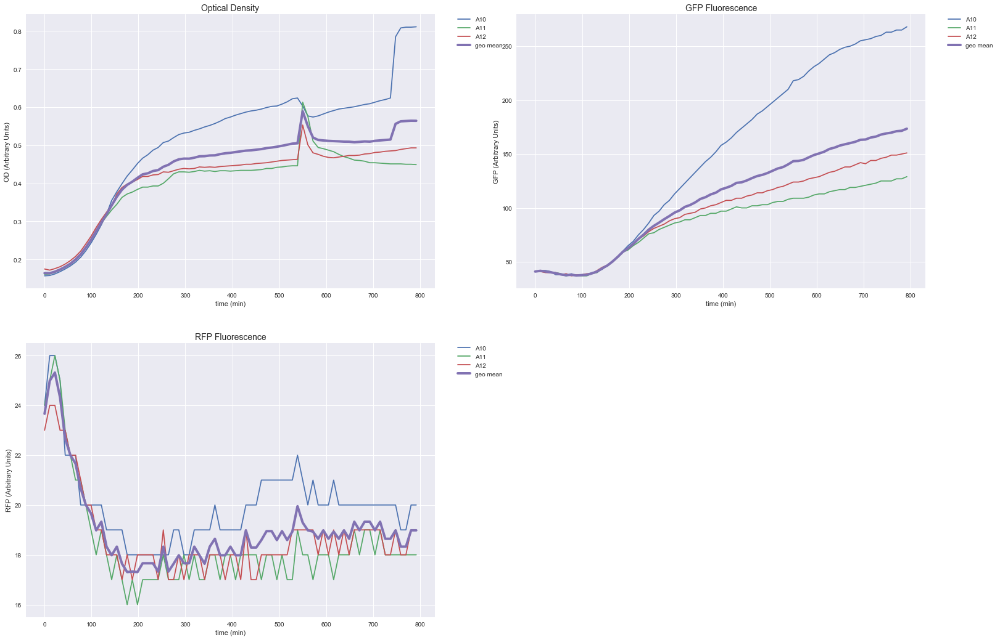

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>CTL8 // BL21 // No Plasmid // IPTG: 0.5 mM // Ara : 0 mM</span>

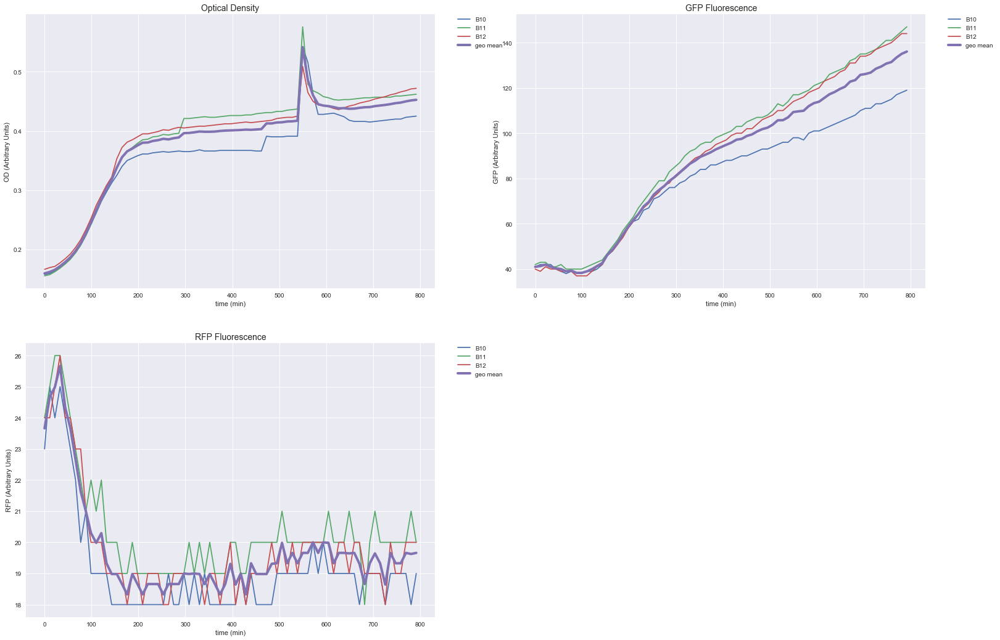

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>CTL9 // BL21 // No Plasmid // IPTG: 0.0 mM // Ara : 1 mM</span>

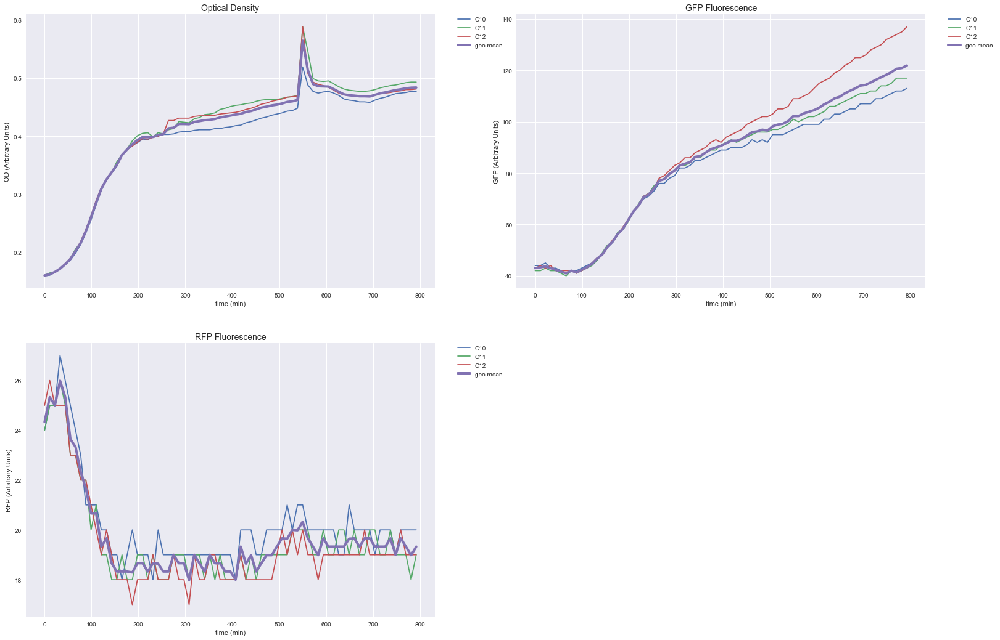

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:200%;font-weight:900'><br> BL21 - pECJ3 + pZA16mflon</span>

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>SPL10 // BL21 // pECJ3 + pZA16mflon // IPTG: 0.0 mM // Ara : 0 mM</span>

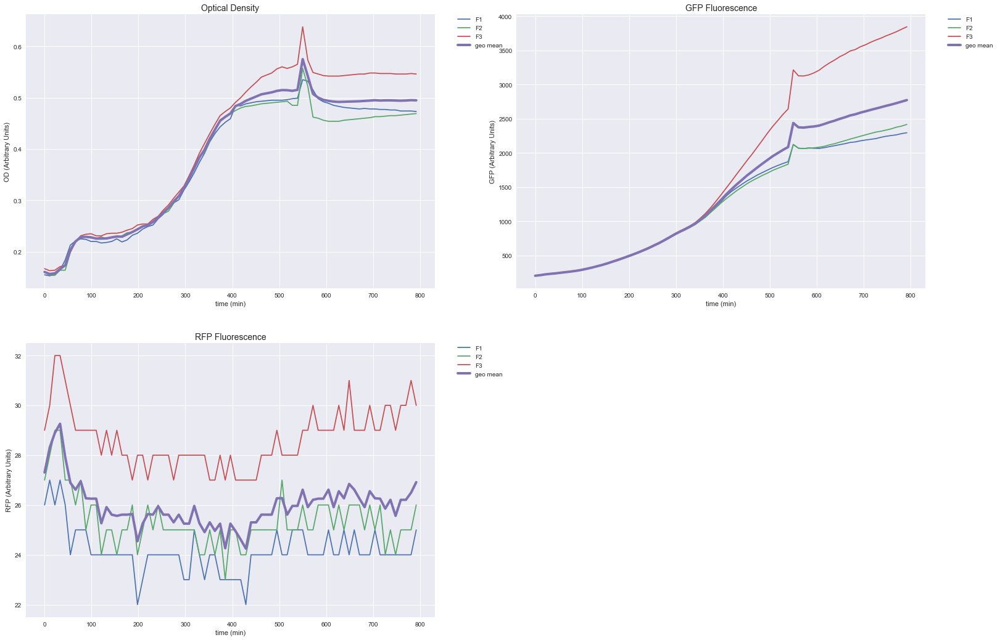

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>SPL11 // BL21 // pECJ3 + pZA16mflon // IPTG: 0.5 mM // Ara : 0 mM</span>

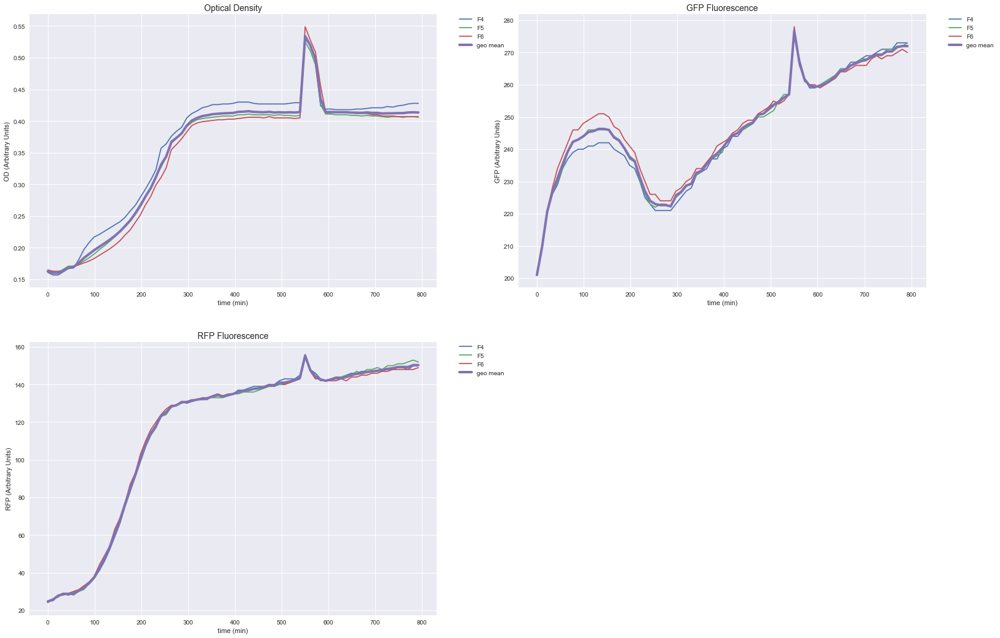

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>SPL12 // BL21 // pECJ3 + pZA16mflon // IPTG: 0.0 mM // Ara : 1 mM</span>

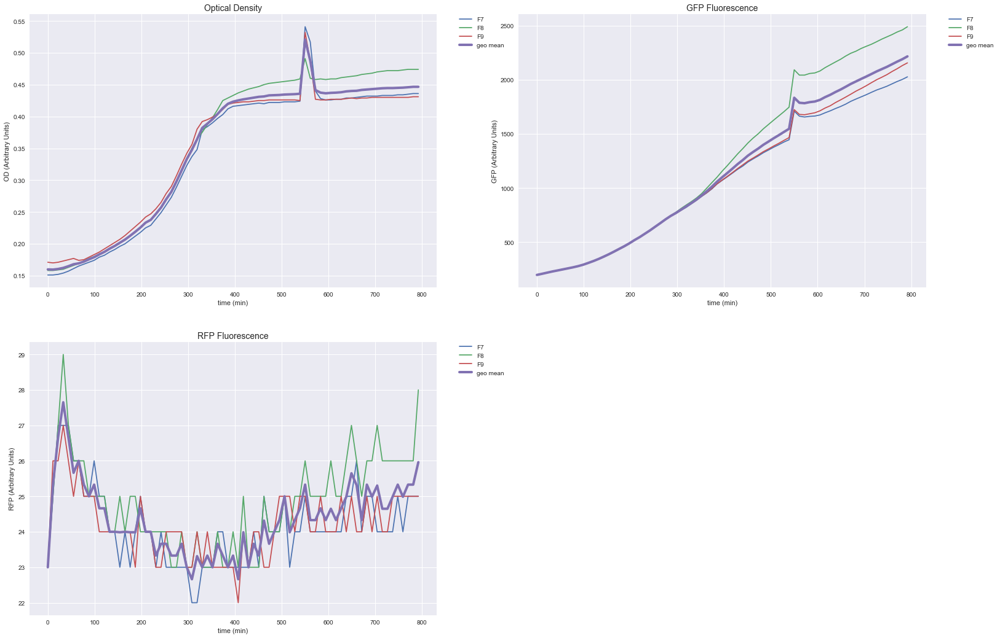

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:200%;font-weight:900'><br> BL21 - pECJ3D + pZA16mflon</span>

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>SPL13 // BL21 // pECJ3D + pZA16mflon // IPTG: 0.0 mM // Ara : 0 mM</span>

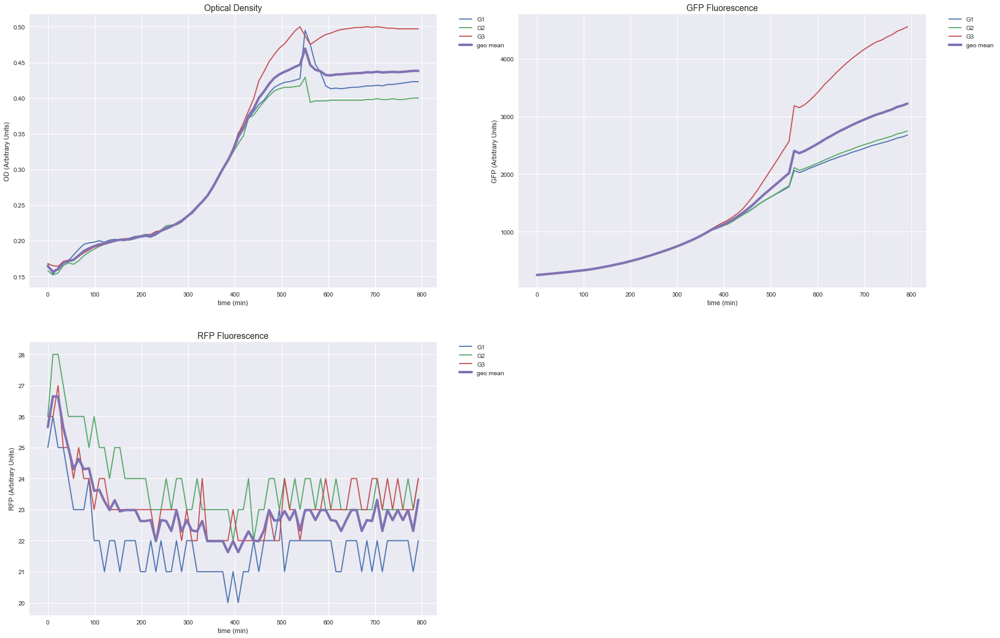

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>SPL14 // BL21 // pECJ3D + pZA16mflon // IPTG: 0.5 mM // Ara : 0 mM</span>

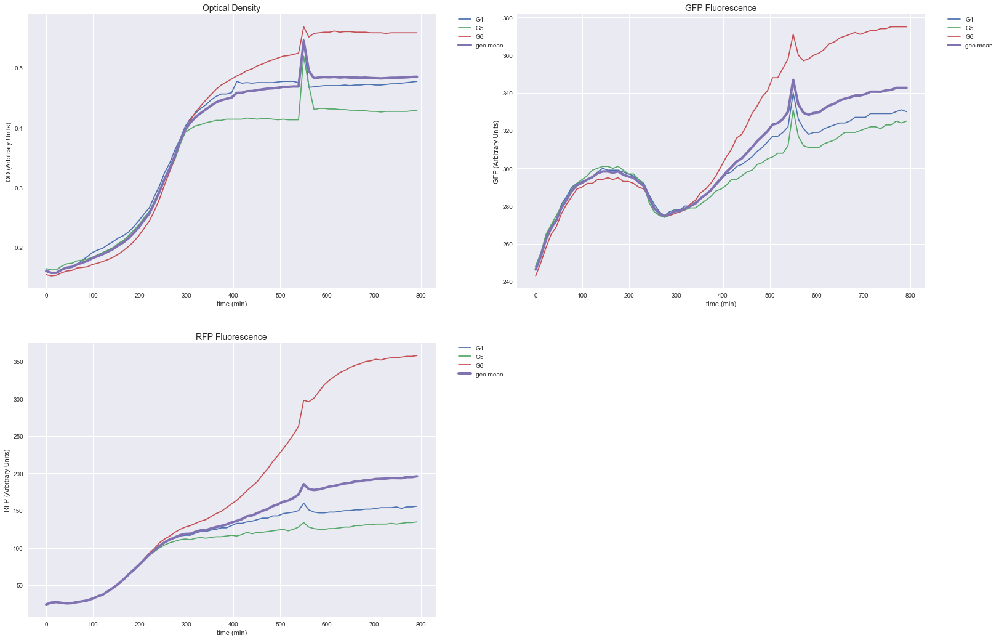

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>SPL15 // BL21 // pECJ3D + pZA16mflon // IPTG: 0.0 mM // Ara : 1 mM</span>

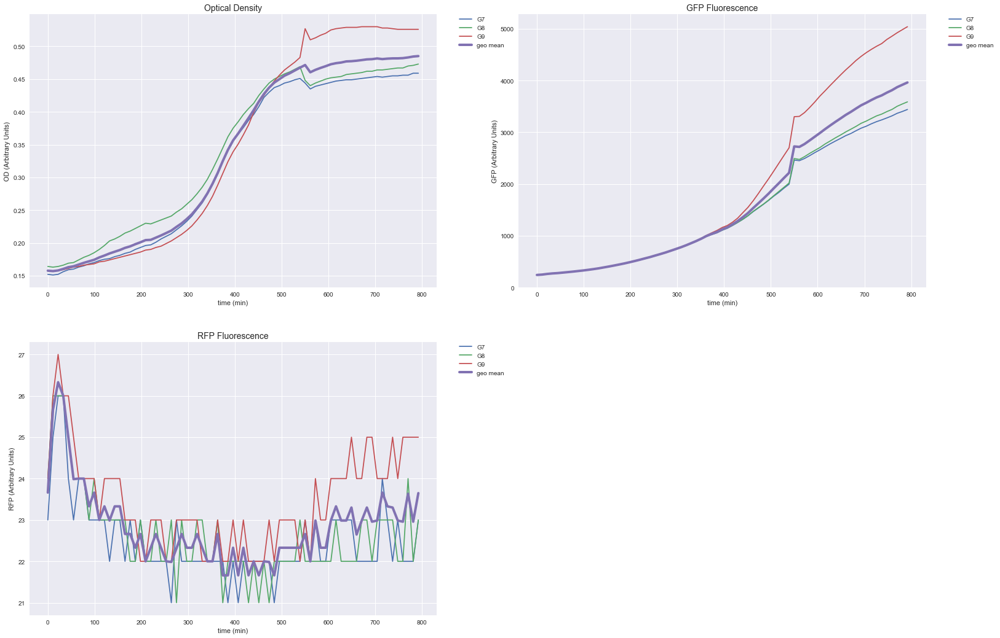

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:200%;font-weight:900'><br>Strain : DH5alpha</span>

<div style='background-color:#4682B4;width:100%;height:20px;'></div>

<span style='font-size:200%;font-weight:900'><br> DH5alpha - GFP+</span>

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>CTL1 // DH5alpha // GFP+ // IPTG: 0.0 mM // Ara : 0 mM</span>

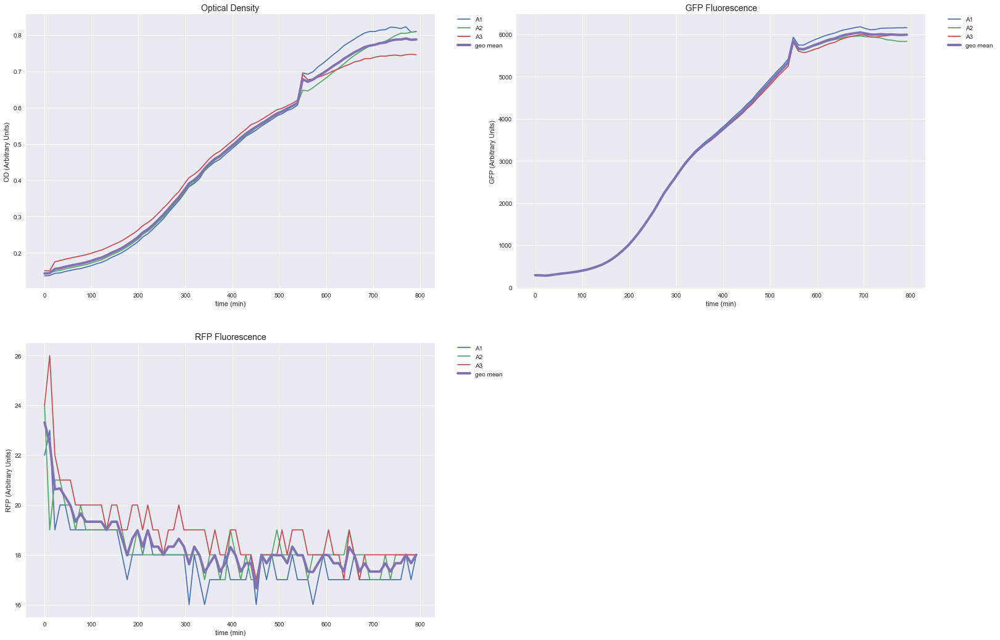

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>CTL2 // DH5alpha // GFP+ // IPTG: 0.5 mM // Ara : 0 mM</span>

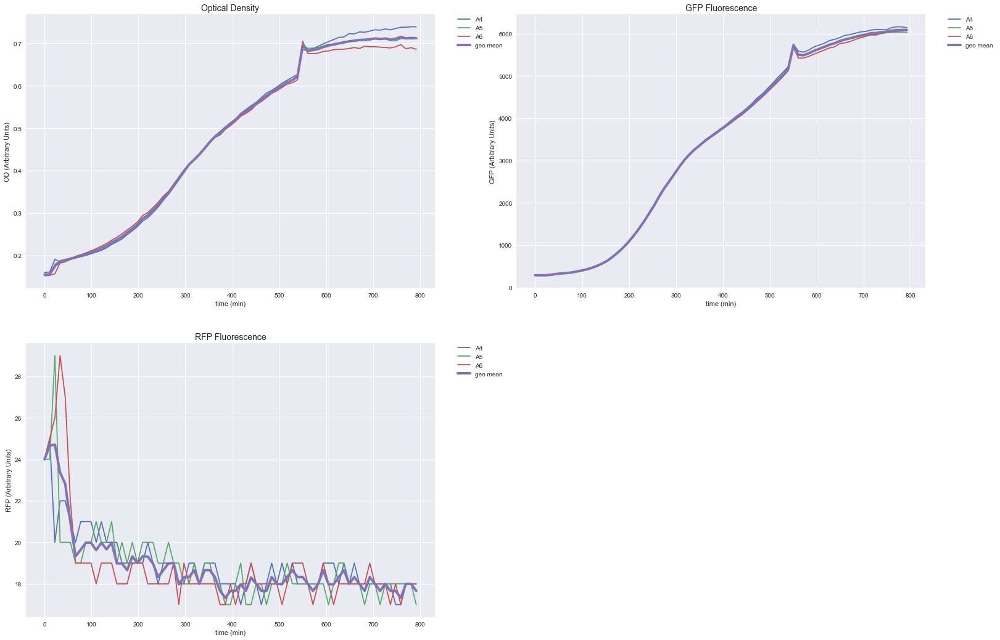

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>CTL3 // DH5alpha // GFP+ // IPTG: 0.0 mM // Ara : 1 mM</span>

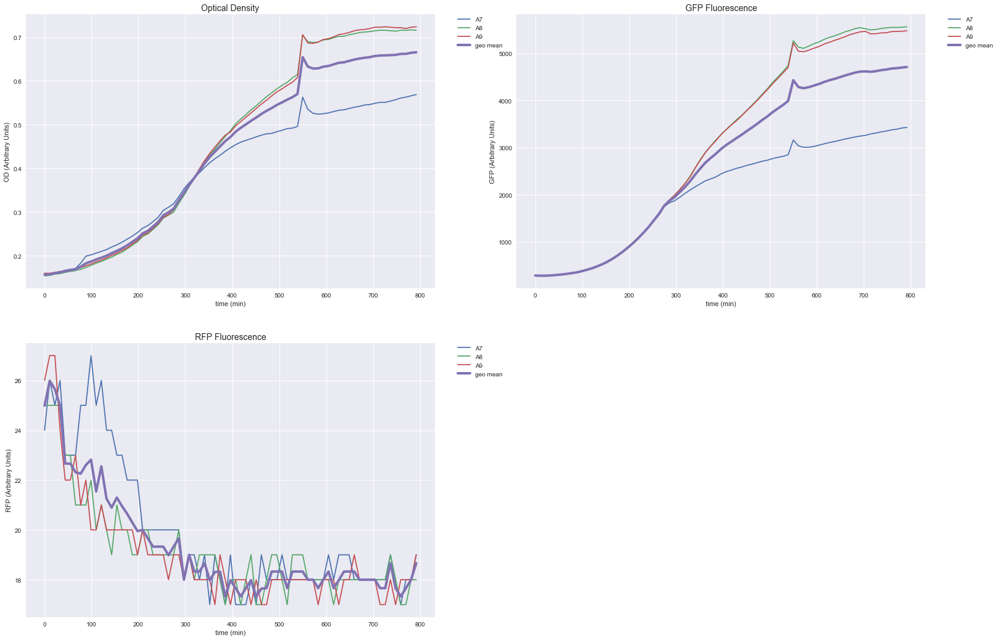

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:200%;font-weight:900'><br> DH5alpha - RFP+</span>

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>CTL4 // DH5alpha // RFP+ // IPTG: 0.0 mM // Ara : 0 mM</span>

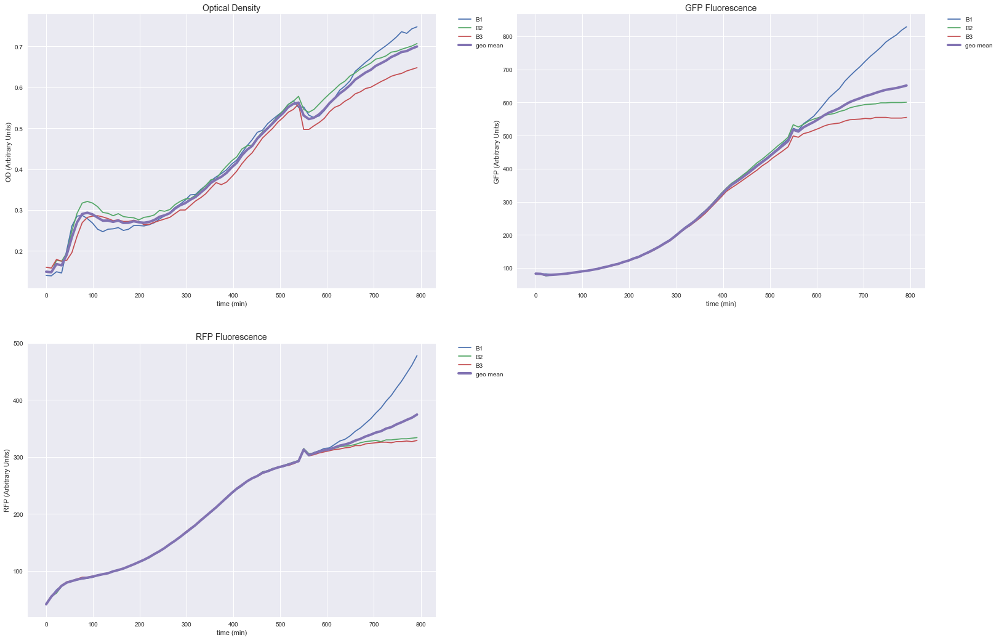

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>CTL5 // DH5alpha // RFP+ // IPTG: 0.5 mM // Ara : 0 mM</span>

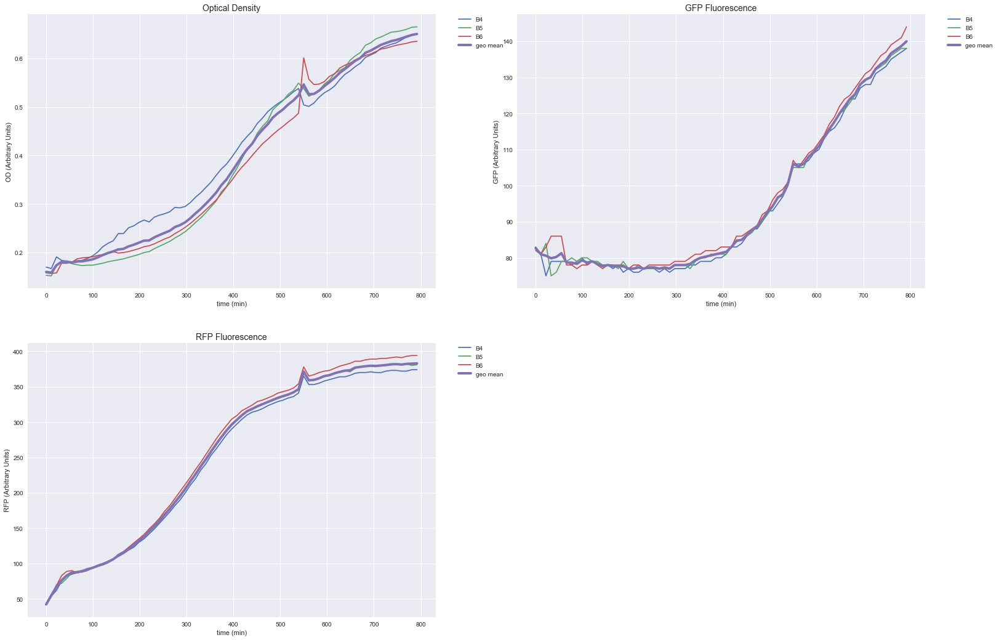

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>CTL6 // DH5alpha // RFP+ // IPTG: 0.0 mM // Ara : 1 mM</span>

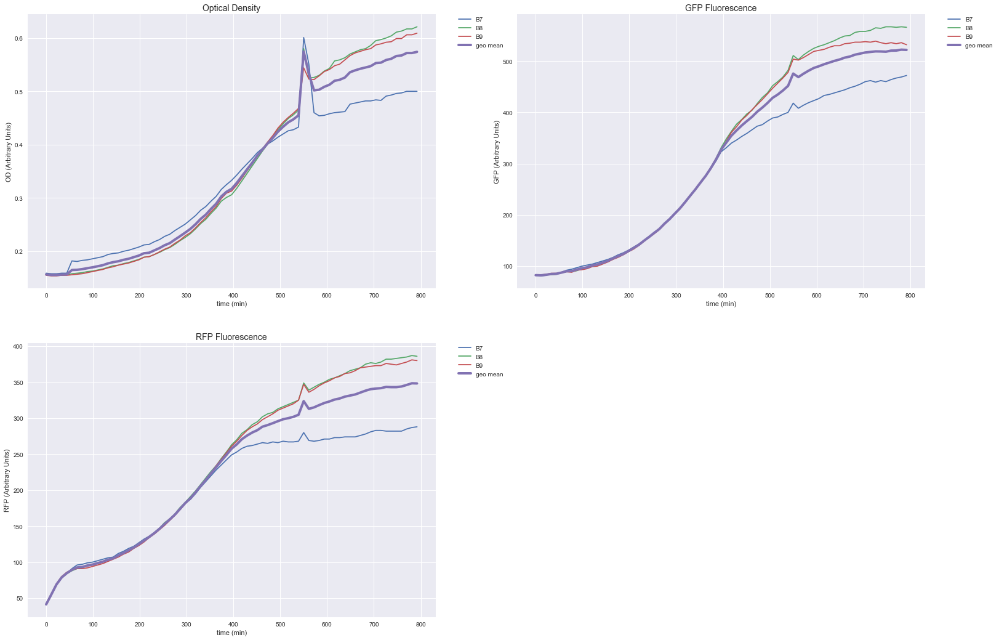

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:200%;font-weight:900'><br>Strain : Top10</span>

<div style='background-color:#4682B4;width:100%;height:20px;'></div>

<span style='font-size:200%;font-weight:900'><br> Top10 - No Plasmid</span>

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>CTL10 // Top10 // No Plasmid // IPTG: 0.0 mM // Ara : 0 mM</span>

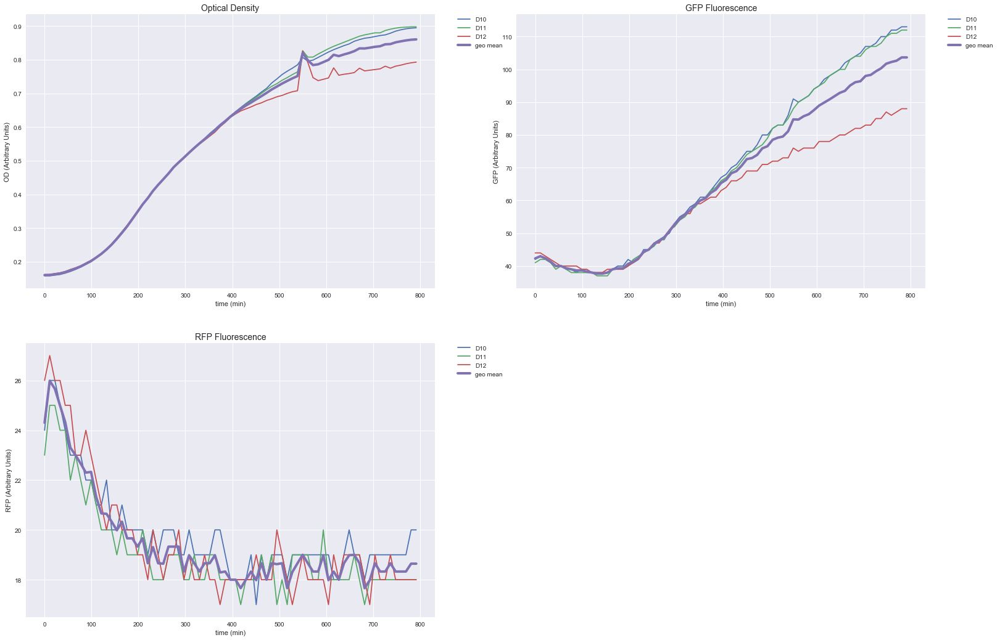

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>CTL11 // Top10 // No Plasmid // IPTG: 0.5 mM // Ara : 0 mM</span>

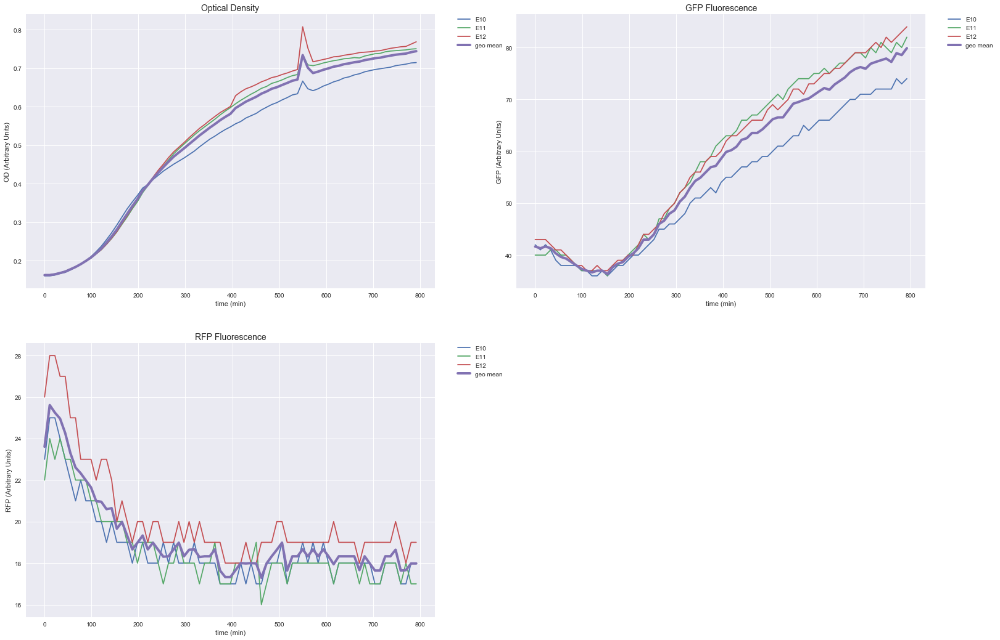

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>CTL12 // Top10 // No Plasmid // IPTG: 0.0 mM // Ara : 1 mM</span>

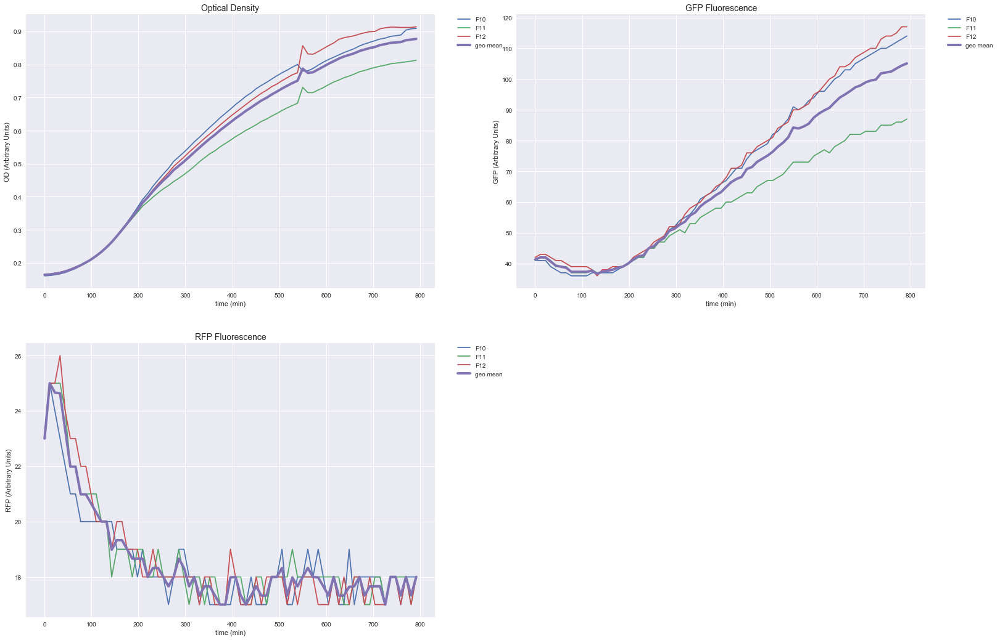

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:200%;font-weight:900'><br>Strain : ∆lacI∆araC</span>

<div style='background-color:#4682B4;width:100%;height:20px;'></div>

<span style='font-size:200%;font-weight:900'><br> ∆lacI∆araC -  pECJ3B + pZA16mflon</span>

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>SPL4 // ∆lacI∆araC //  pECJ3B + pZA16mflon // IPTG: 0.0 mM // Ara : 0 mM</span>

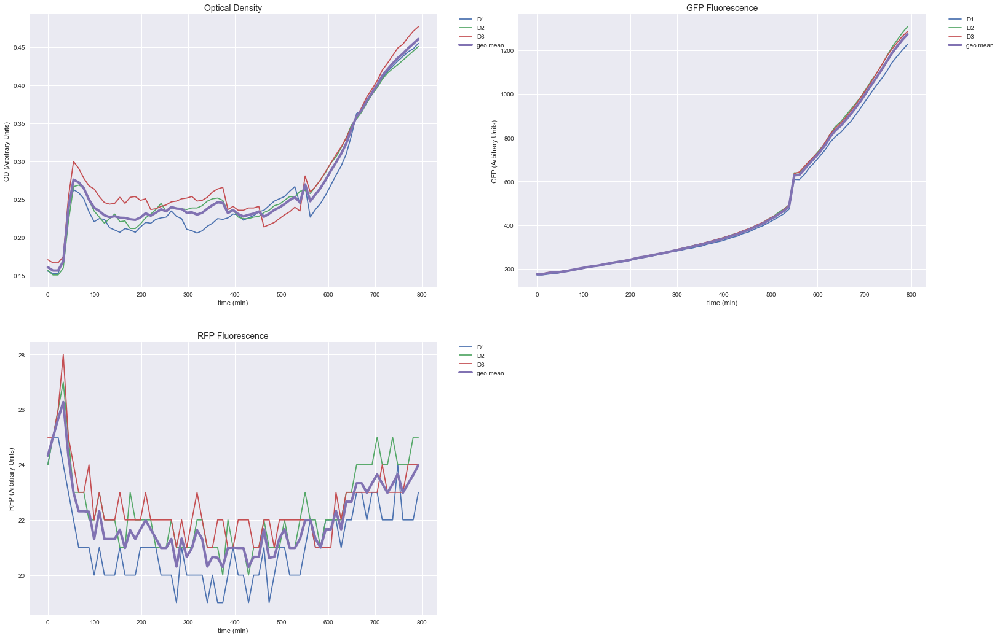

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>SPL5 // ∆lacI∆araC //  pECJ3B + pZA16mflon // IPTG: 0.5 mM // Ara : 0 mM</span>

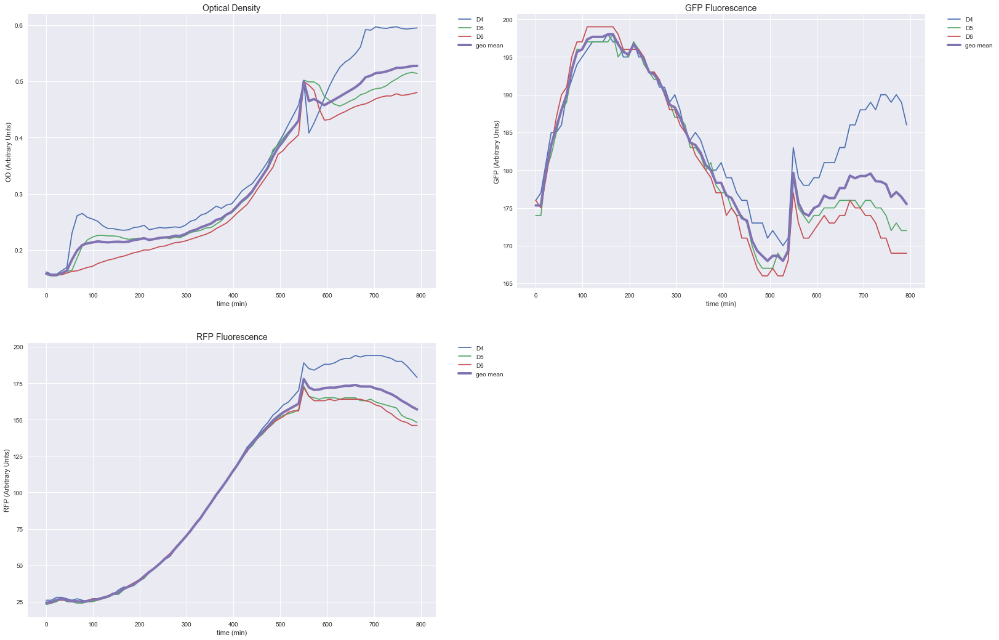

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>SPL6 // ∆lacI∆araC //  pECJ3B + pZA16mflon // IPTG: 0.0 mM // Ara : 1 mM</span>

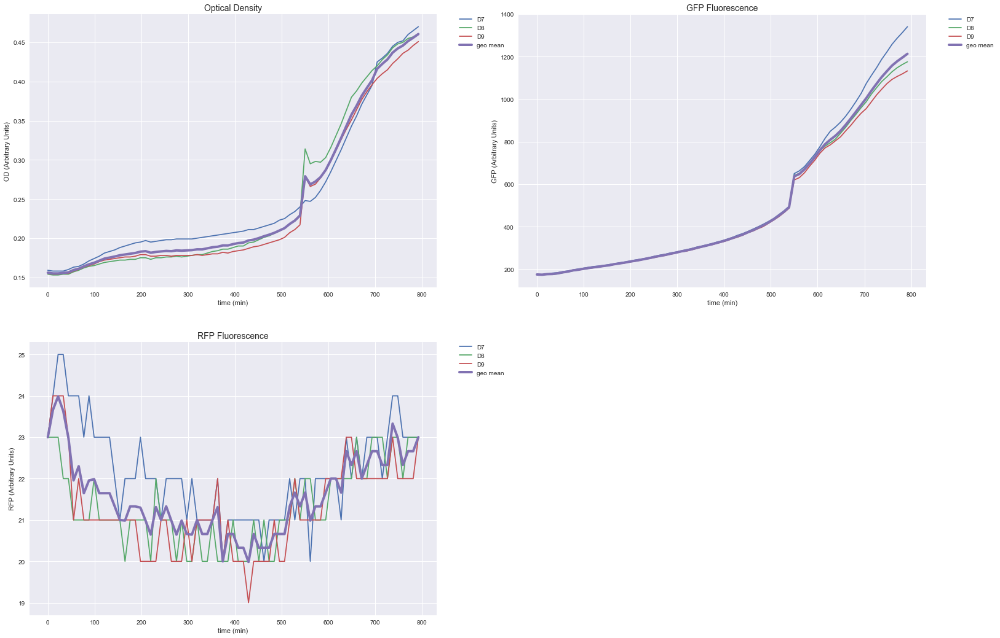

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:200%;font-weight:900'><br> ∆lacI∆araC - pECJ3 + pZA16mflon</span>

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>SPL1 // ∆lacI∆araC // pECJ3 + pZA16mflon // IPTG: 0.0 mM // Ara : 0 mM</span>

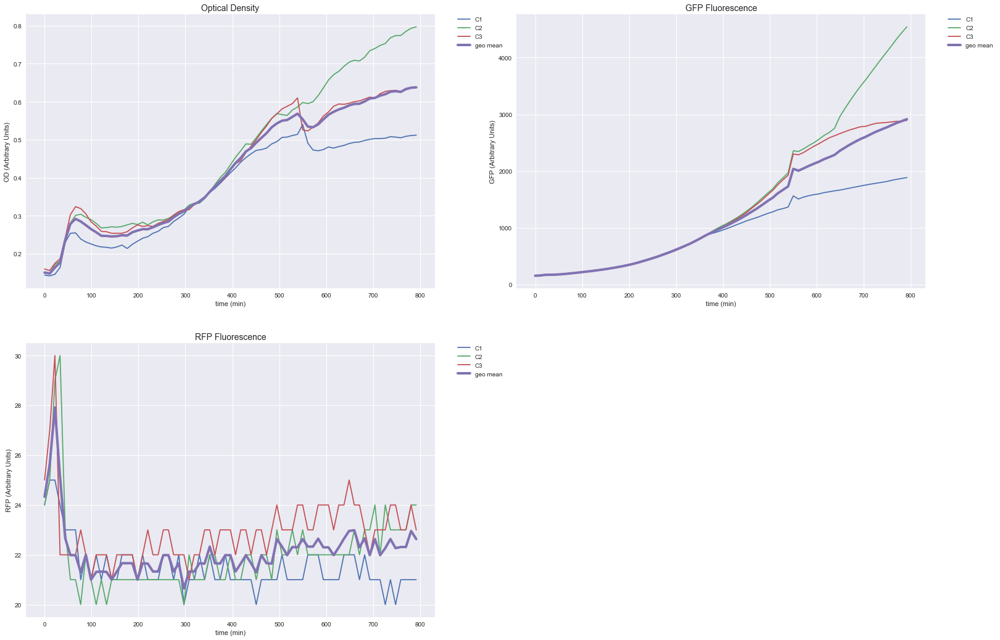

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>SPL2 // ∆lacI∆araC // pECJ3 + pZA16mflon // IPTG: 0.5 mM // Ara : 0 mM</span>

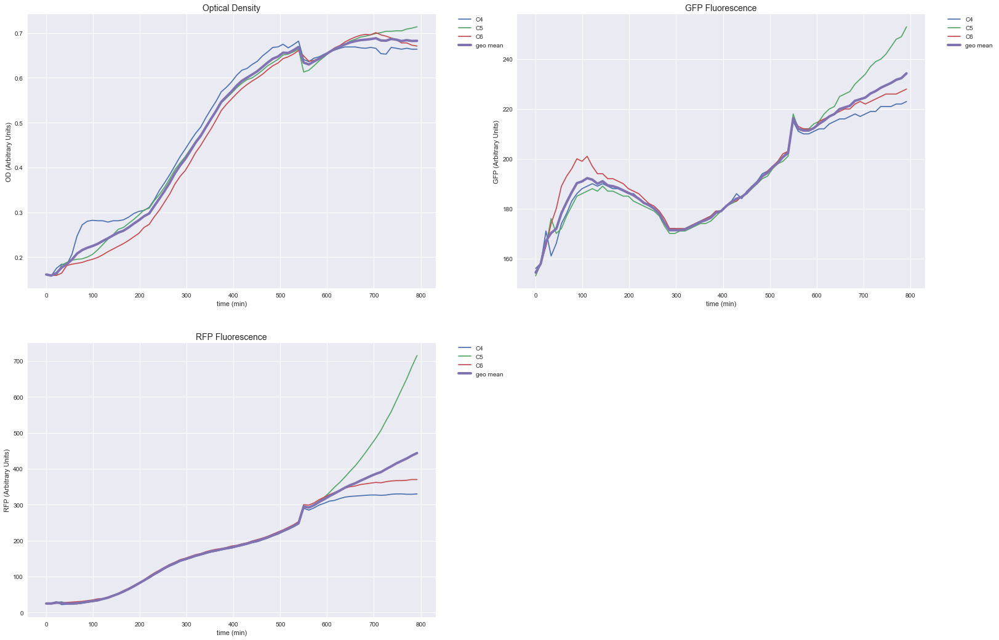

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>SPL3 // ∆lacI∆araC // pECJ3 + pZA16mflon // IPTG: 0.0 mM // Ara : 1 mM</span>

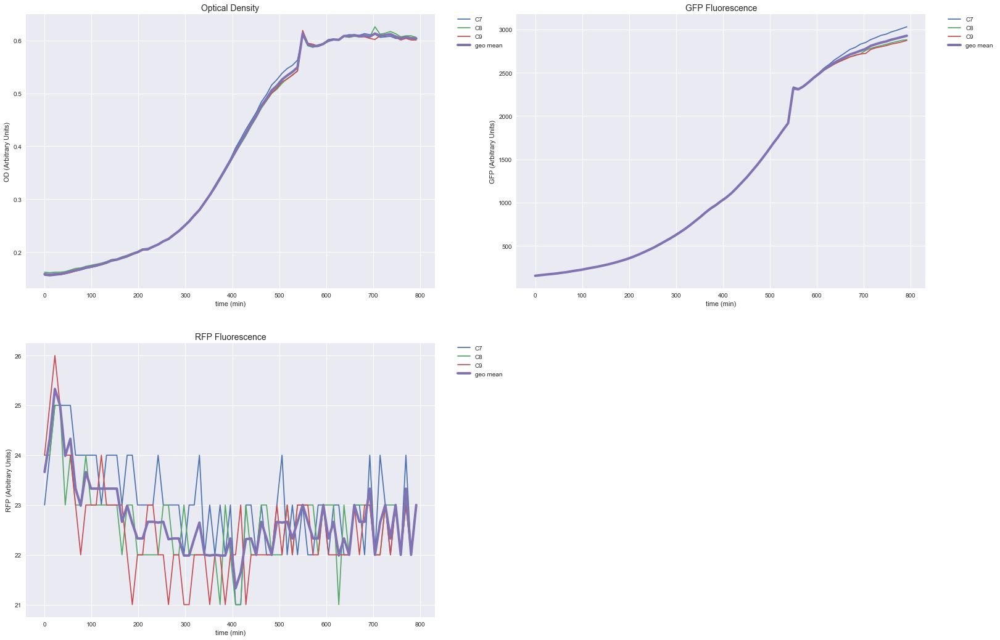

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:200%;font-weight:900'><br> ∆lacI∆araC - pECJ3D + pZA16mflo</span>

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>SPL7 // ∆lacI∆araC // pECJ3D + pZA16mflo // IPTG: 0.0 mM // Ara : 0 mM</span>

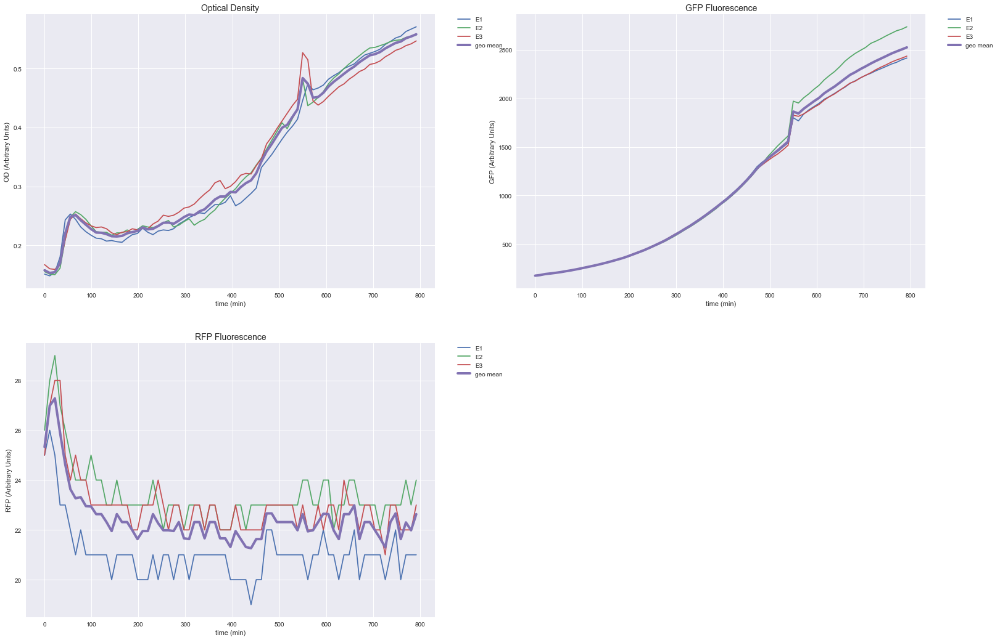

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>SPL8 // ∆lacI∆araC // pECJ3D + pZA16mflo // IPTG: 0.5 mM // Ara : 0 mM</span>

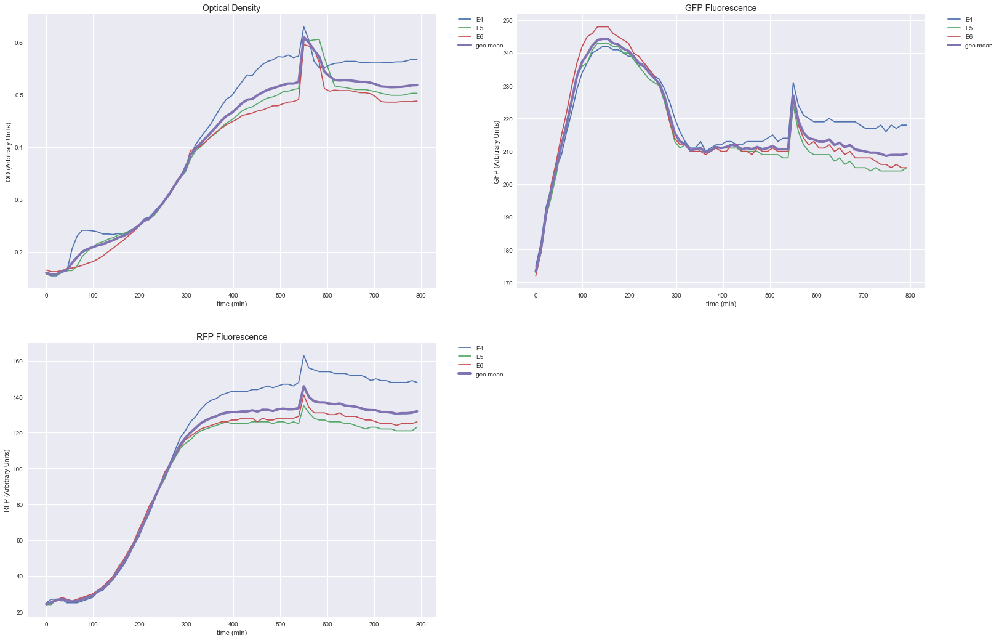

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>SPL9 // ∆lacI∆araC // pECJ3D + pZA16mflo // IPTG: 0.0 mM // Ara : 1 mM</span>

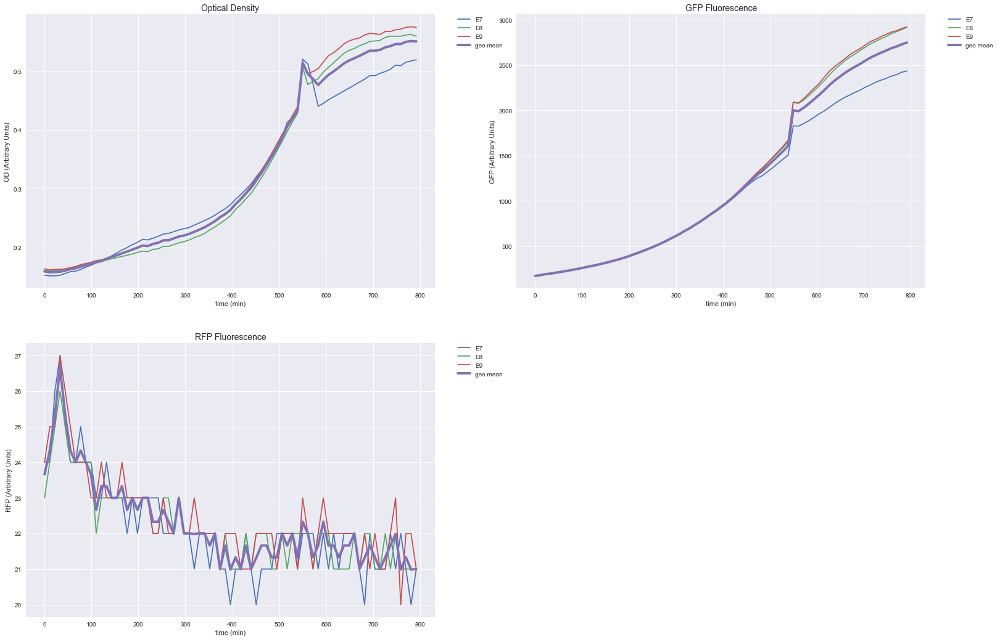

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

In [9]:
printmd("<span style='font-size:200%;font-weight:900'><br>Plotting the Experiments</span>")
printmd("<div style='background-color:#4682B4;width:100%;height:20px;'></div>")
    
all_strains = np.unique([exp['Strain'] for exp in non_controls])
all_strains.sort()
# the plasmid options depend on the strains so we will do the splicing in the loop...

for strain in all_strains:
    
    printmd("<span style='font-size:200%;font-weight:900'><br>Strain : {}</span>".format(strain))
    printmd("<div style='background-color:#4682B4;width:100%;height:20px;'></div>")

    associated_plasmids = np.unique([exp['Plasmid'] for exp in non_controls if exp['Strain'] == strain])
    associated_plasmids.sort()
    
    for plasmid in associated_plasmids:
        printmd("<span style='font-size:200%;font-weight:900'><br> {} - {}</span>".format(strain,plasmid))
        printmd("<div style='background-color:#4682B4;width:100%;height:10px;'></div>")
        
        # We now retrieve the corresponding exp and rank them / iptg
        # after that we retrieve the wells and display (we could have a deeper tree by splitting / inducers)
        # But this will be good enough
        
        associated_exps = [exp for exp in non_controls if exp['Strain'] == strain and exp['Plasmid'] == plasmid]
    
        for exp in associated_exps:
            # from mask we retrieve the corresponding wells
            sub_frame = mask_data[mask_data['Name'] == exp['Name']]
            wells = [x[0]+str(x[1]) for x in zip(sub_frame['Row'],sub_frame['Col'])]
            OD_frame = OD_data[wells]
            time = OD_data[(OD_data['Time']>=t_min) & (OD_data['Time']<=t_max)]['Time']
            all_ODs = np.array(OD_data[(OD_data['Time']>=t_min) & (OD_data['Time']<=t_max)][wells])
            all_GFPs = np.array(GFP_data[(GFP_data['Time']>=t_min) & (GFP_data['Time']<=t_max)][wells])
            all_RFPs = np.array(RFP_data[(RFP_data['Time']>=t_min) & (RFP_data['Time']<=t_max)][wells])
    
            geo_mean_OD = mstats.gmean(all_ODs,axis=1) 
            geo_mean_GFP = mstats.gmean(all_GFPs,axis=1)    
            geo_mean_RFP = mstats.gmean(all_RFPs,axis=1) 

            fig = plt.figure(figsize=(18,18))
            ax = fig.add_subplot(221)
            ax2 = fig.add_subplot(222)
            ax3 = fig.add_subplot(223)
            for well in wells:
                ax.plot(time, OD_data[(OD_data['Time']>=t_min) & (OD_data['Time']<=t_max)][well],label = well)


            ax.plot(time, geo_mean_OD,lw=4,label = 'geo mean')    

            ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
            ax.set_title("Optical Density", fontsize=14)   
            ax.set_xlabel('time (min)')
            ax.set_ylabel('OD (Arbitrary Units)')

            for well in wells:
                ax2.plot(time, GFP_data[(GFP_data['Time']>=t_min) & (GFP_data['Time']<=t_max)][well],label = well)

            ax2.plot(time, geo_mean_GFP,lw=4,label = 'geo mean')    
            ax2.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
            ax2.set_title("GFP Fluorescence", fontsize=14)   
            ax2.set_xlabel('time (min)')
            ax2.set_ylabel('GFP (Arbitrary Units)')

            for well in wells:
                ax3.plot(time, RFP_data[(RFP_data['Time']>=t_min) & (RFP_data['Time']<=t_max)][well],label = well)

            ax3.plot(time, geo_mean_RFP,lw=4,label = 'geo mean')    
            ax3.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
            ax3.set_title("RFP Fluorescence", fontsize=14)   
            ax3.set_xlabel('time (min)')
            ax3.set_ylabel('RFP (Arbitrary Units)')

            plt.subplots_adjust(left=None, bottom=None, right=1.25, top=None,
                        wspace=None, hspace=None)   
            printmd("<span style='font-size:180%;font-weight:900;color:#4169E1'><br>{} // {} // {} // IPTG: {} mM // Ara : {} mM</span>"
                    .format(exp['Name'],exp['Strain'],exp['Plasmid'],exp['IPTG'],exp['Ara']))
            plt.show()                
            printmd("<div style='background-color:#4682B4;width:100%;height:10px;'></div>")

## We observe Similar odd results as for the controls 

## Estimating the Corrections 

In [11]:
# We are going to use the medium for OD and FL 
# This is far from ideal, but we have too few reliable controls for the FL

# Also we are going to remove wells H4 and H1
sub_frame = mask_data[mask_data['Name'] == 'MED']
wells = [well for well in [x[0]+str(x[1]) for x in zip(sub_frame['Row'],sub_frame['Col'])] if well not in ['H1','H4']]

all_ODs = np.array(OD_data[wells])
all_GFPs = np.array(GFP_data[wells])
all_RFPs = np.array(RFP_data[wells])
geo_mean_OD = mstats.gmean(all_ODs,axis=1) 
geo_mean_GFP = mstats.gmean(all_GFPs,axis=1) 
geo_mean_RFP = mstats.gmean(all_RFPs,axis=1) 

# Now we can apply the corrections ie subtract these estimates to the previous data (except to the time columsn)
# in practive we are going to create two new frames 
# I am lazy so I will make deep copies

corrected_OD_data = OD_data.copy(deep=True)
corrected_GFP_data = GFP_data.copy(deep=True)
corrected_RFP_data = RFP_data.copy(deep=True)
well_list = [col for col in OD_data.columns if col != 'Time'] 

for col in well_list:
    corrected_OD_data[col] = corrected_OD_data[col] - geo_mean_OD
    corrected_GFP_data[col] = corrected_GFP_data[col] - geo_mean_GFP
    corrected_RFP_data[col] = corrected_RFP_data[col] - geo_mean_RFP

<span style='font-size:200%;font-weight:900'><br>Plotting the (Corrected) Experiments</span>

<div style='background-color:#4682B4;width:100%;height:20px;'></div>

<span style='font-size:200%;font-weight:900'><br>Strain : BL21</span>

<div style='background-color:#4682B4;width:100%;height:20px;'></div>

<span style='font-size:200%;font-weight:900'><br> BL21 - No Plasmid</span>

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>CTL7 // BL21 // No Plasmid // IPTG: 0.0 mM // Ara : 0 mM</span>

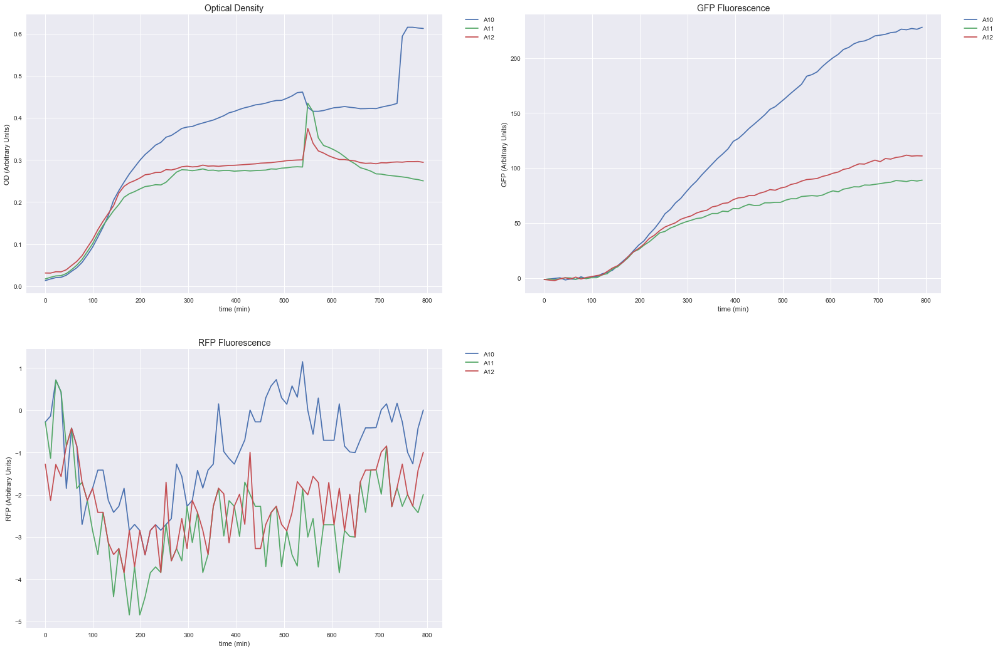

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>CTL8 // BL21 // No Plasmid // IPTG: 0.5 mM // Ara : 0 mM</span>

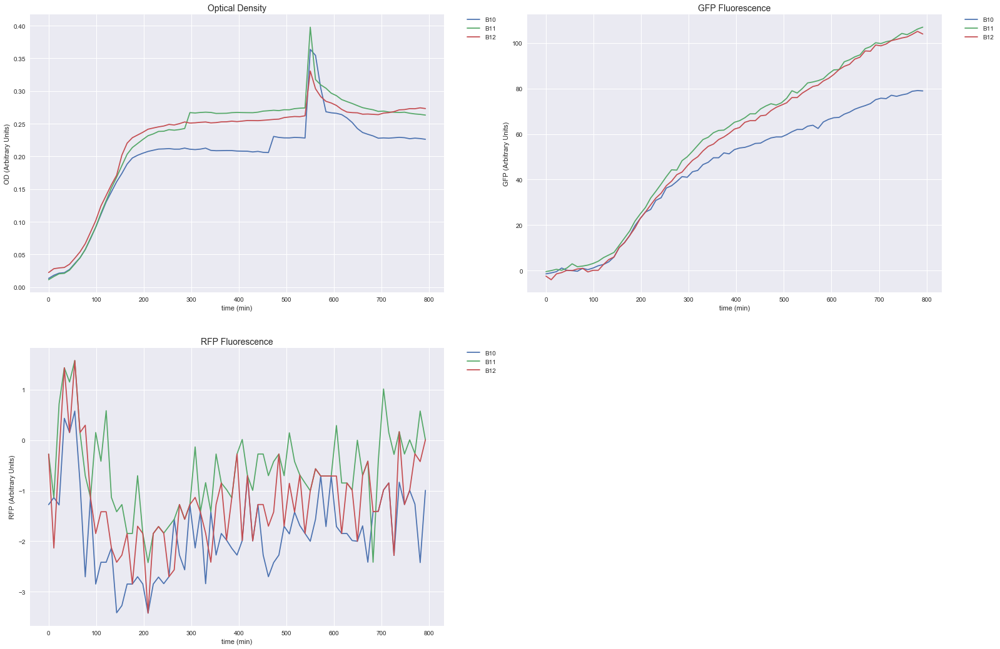

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>CTL9 // BL21 // No Plasmid // IPTG: 0.0 mM // Ara : 1 mM</span>

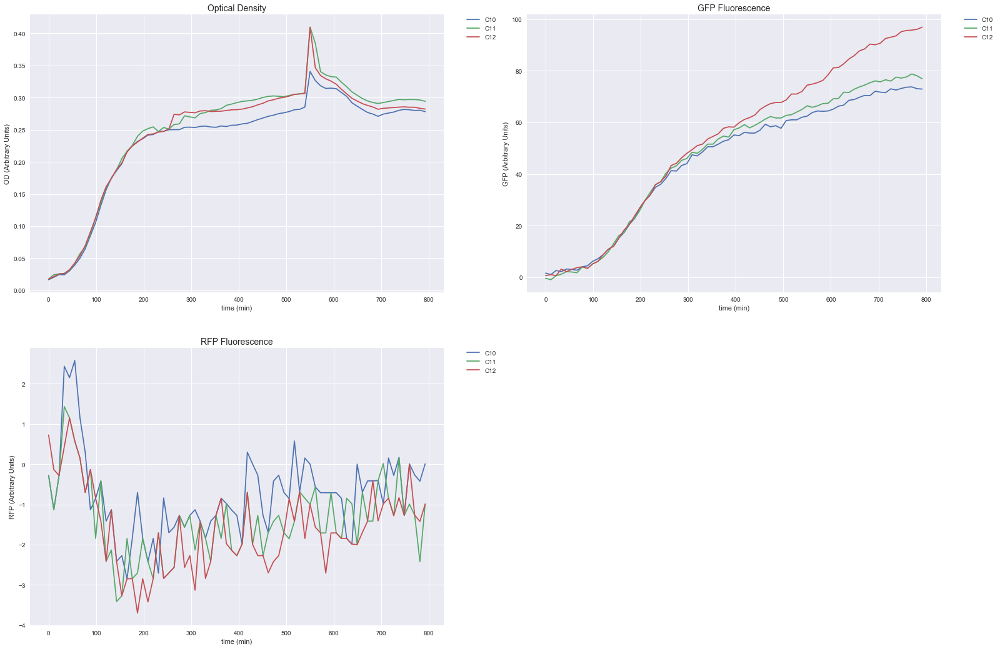

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:200%;font-weight:900'><br> BL21 - pECJ3 + pZA16mflon</span>

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>SPL10 // BL21 // pECJ3 + pZA16mflon // IPTG: 0.0 mM // Ara : 0 mM</span>

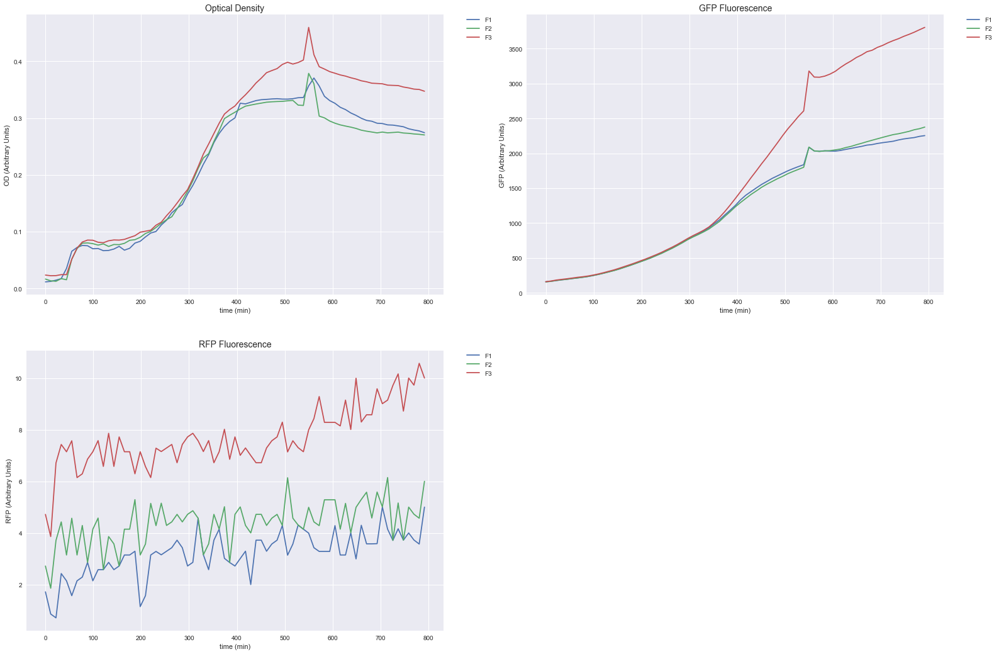

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>SPL11 // BL21 // pECJ3 + pZA16mflon // IPTG: 0.5 mM // Ara : 0 mM</span>

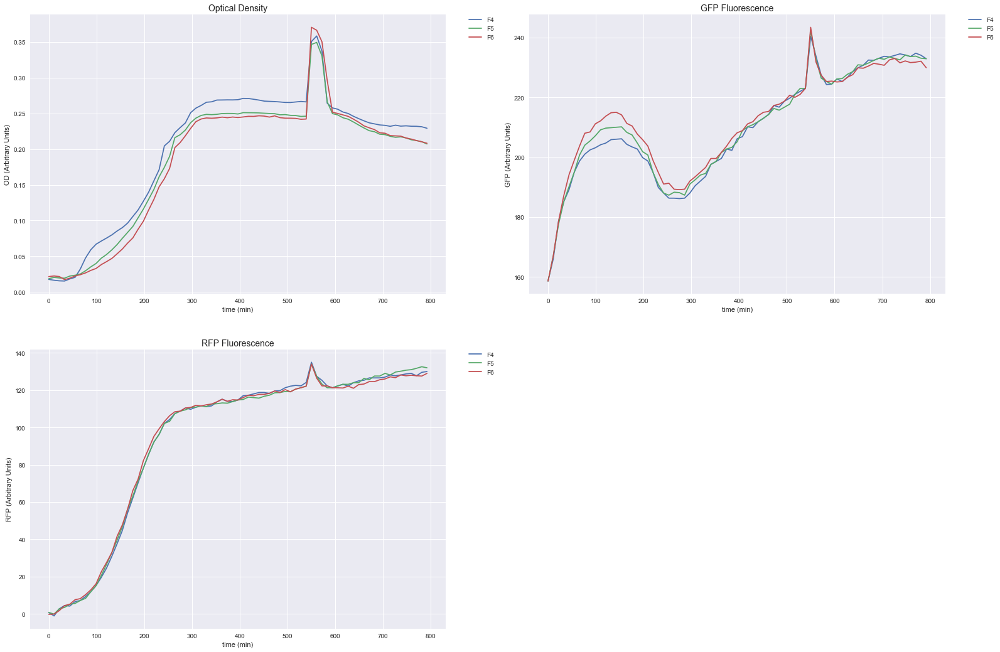

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>SPL12 // BL21 // pECJ3 + pZA16mflon // IPTG: 0.0 mM // Ara : 1 mM</span>

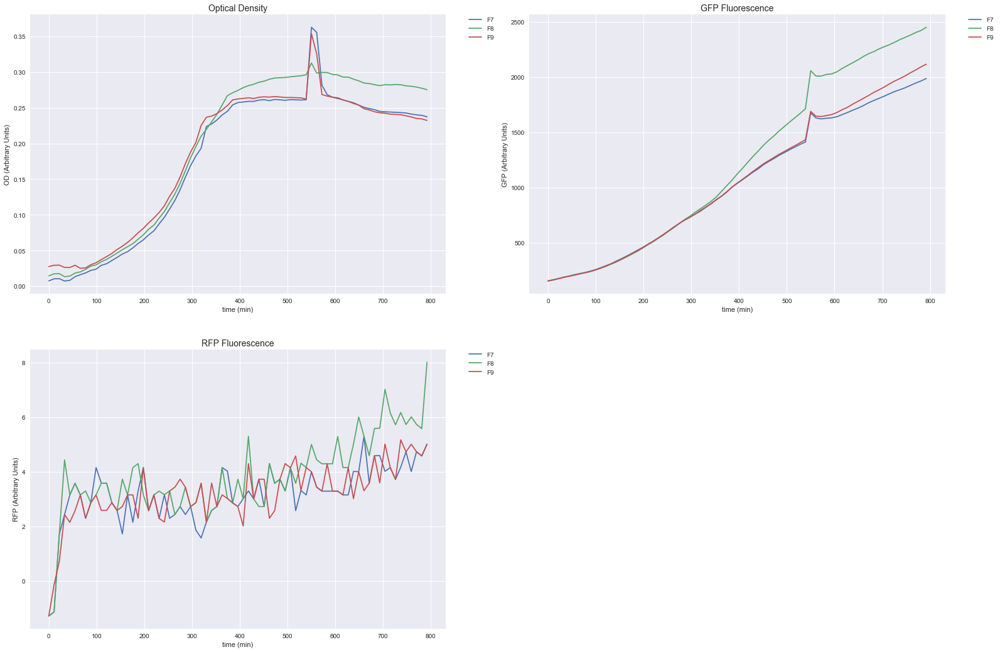

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:200%;font-weight:900'><br> BL21 - pECJ3D + pZA16mflon</span>

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>SPL13 // BL21 // pECJ3D + pZA16mflon // IPTG: 0.0 mM // Ara : 0 mM</span>

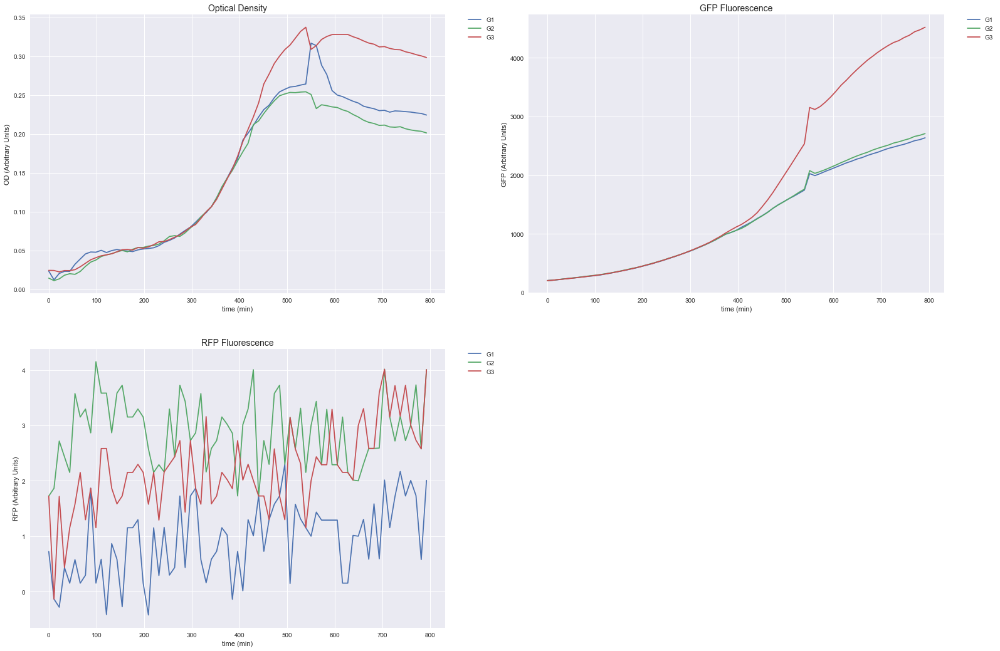

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>SPL14 // BL21 // pECJ3D + pZA16mflon // IPTG: 0.5 mM // Ara : 0 mM</span>

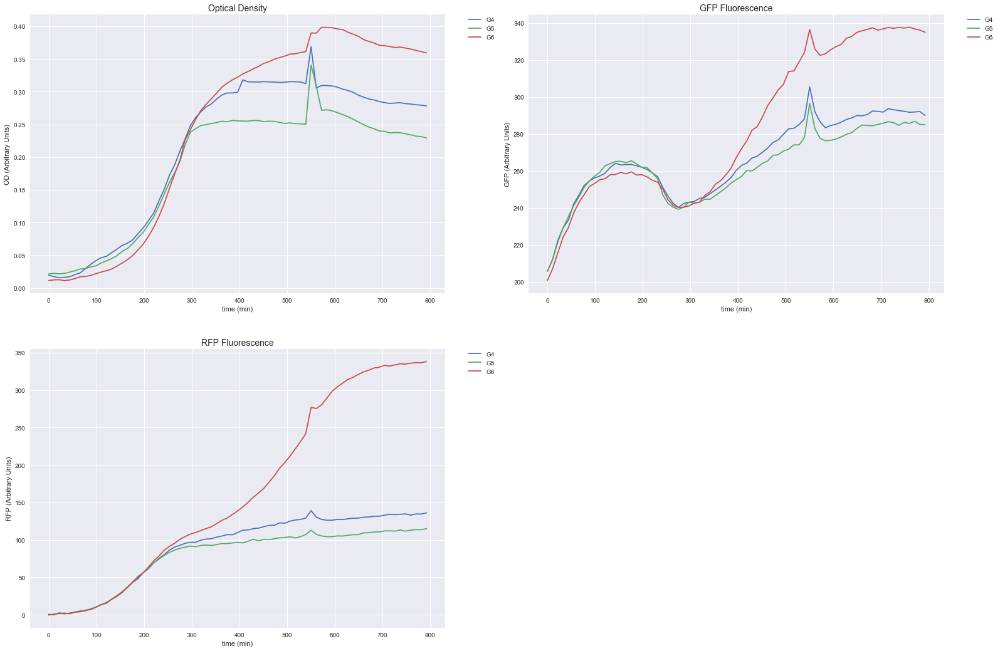

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>SPL15 // BL21 // pECJ3D + pZA16mflon // IPTG: 0.0 mM // Ara : 1 mM</span>

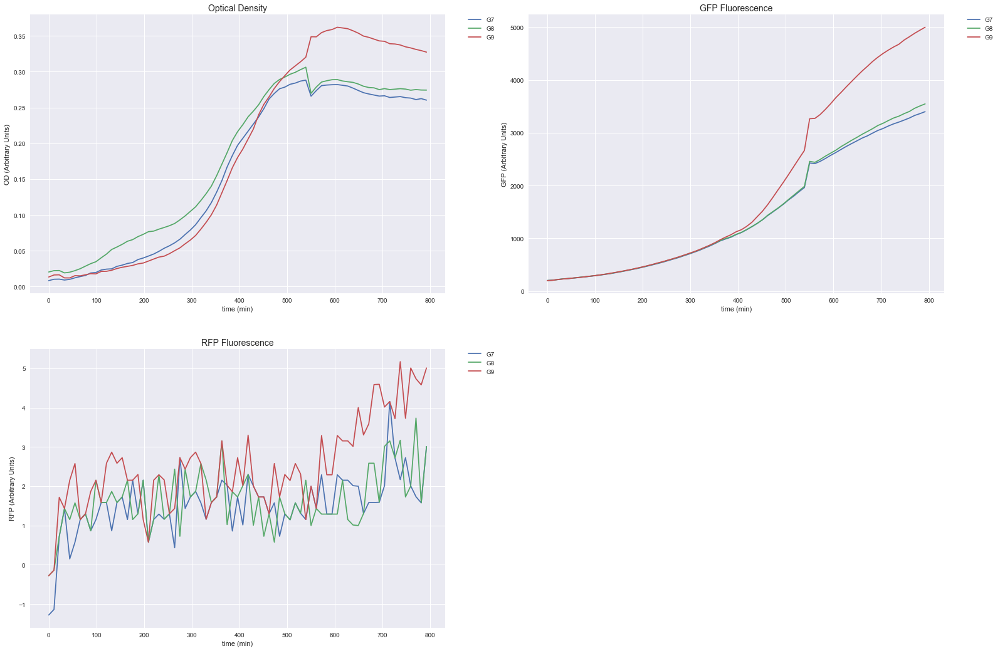

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:200%;font-weight:900'><br>Strain : DH5alpha</span>

<div style='background-color:#4682B4;width:100%;height:20px;'></div>

<span style='font-size:200%;font-weight:900'><br> DH5alpha - GFP+</span>

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>CTL1 // DH5alpha // GFP+ // IPTG: 0.0 mM // Ara : 0 mM</span>

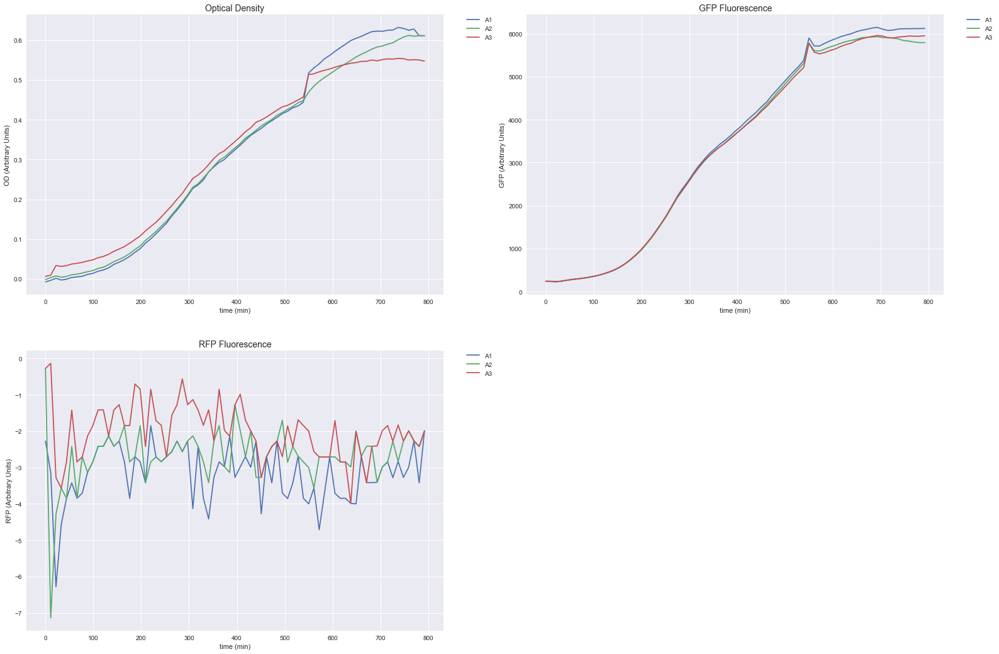

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>CTL2 // DH5alpha // GFP+ // IPTG: 0.5 mM // Ara : 0 mM</span>

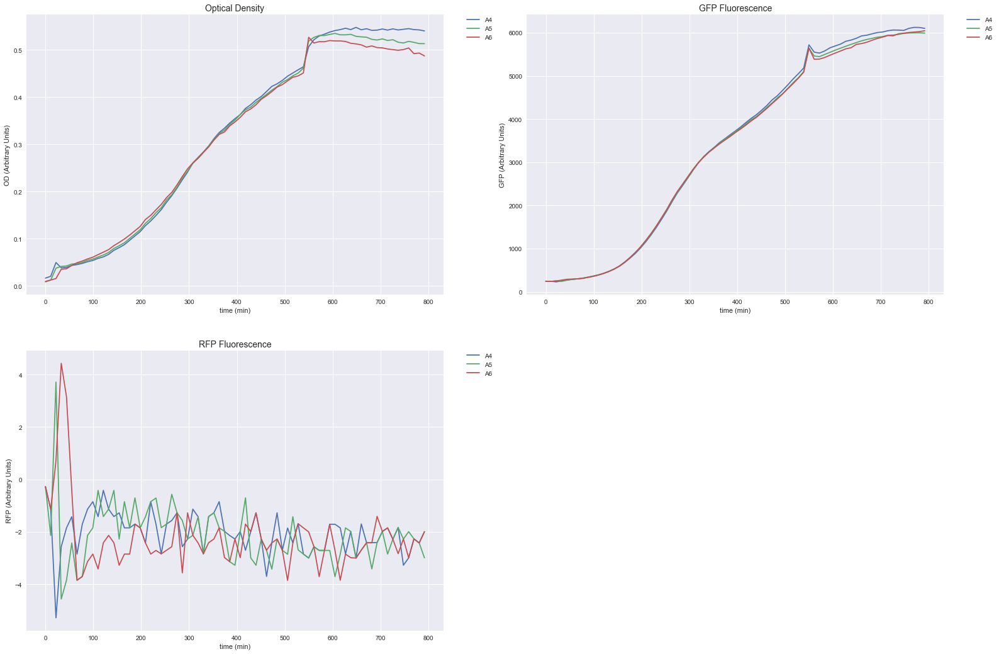

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>CTL3 // DH5alpha // GFP+ // IPTG: 0.0 mM // Ara : 1 mM</span>

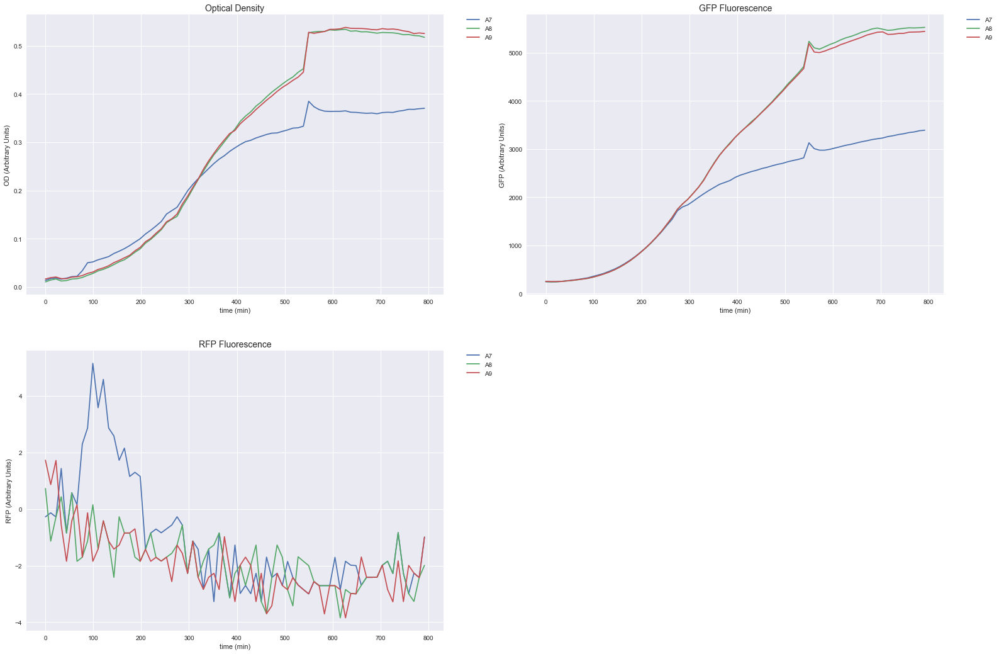

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:200%;font-weight:900'><br> DH5alpha - RFP+</span>

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>CTL4 // DH5alpha // RFP+ // IPTG: 0.0 mM // Ara : 0 mM</span>

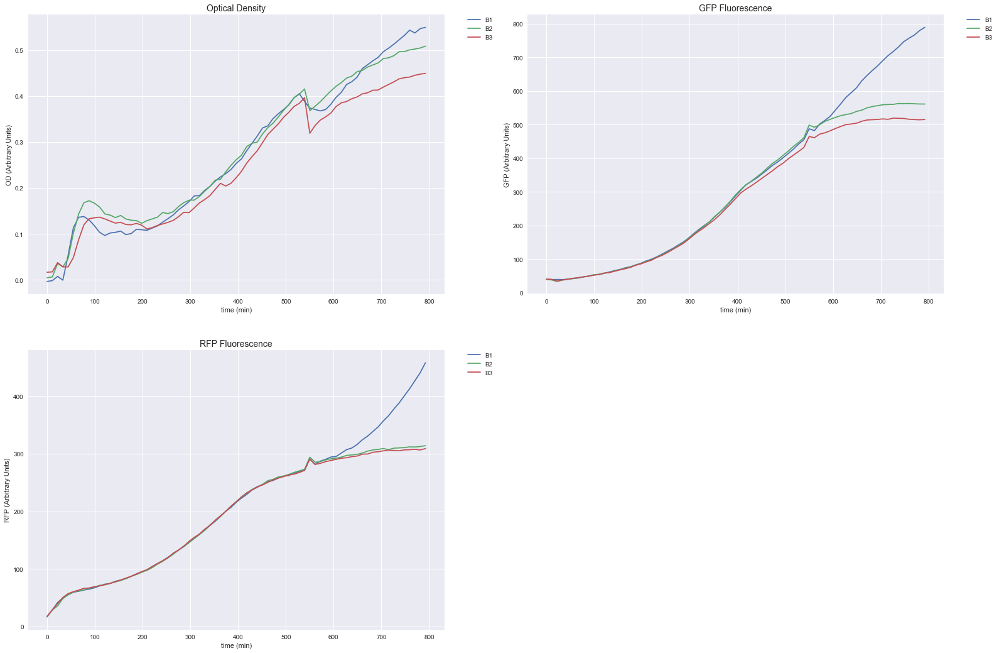

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>CTL5 // DH5alpha // RFP+ // IPTG: 0.5 mM // Ara : 0 mM</span>

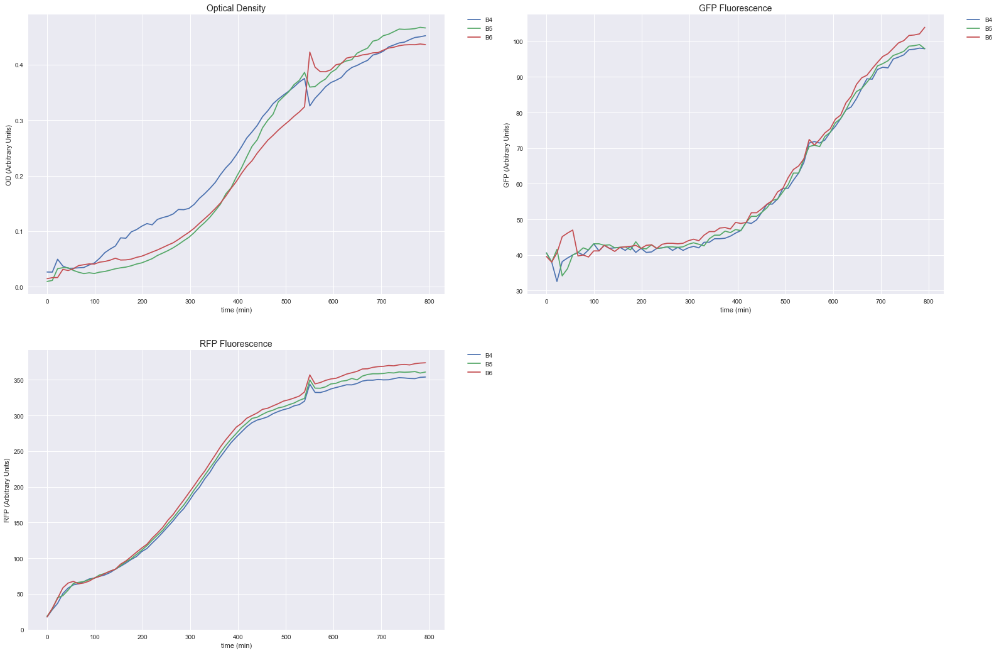

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>CTL6 // DH5alpha // RFP+ // IPTG: 0.0 mM // Ara : 1 mM</span>

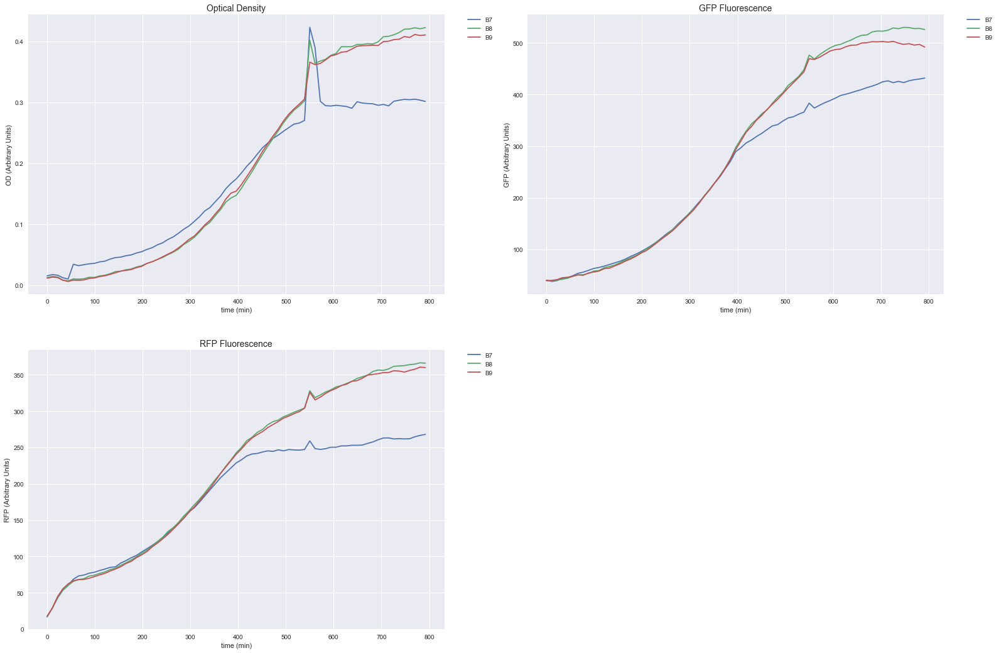

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:200%;font-weight:900'><br>Strain : Top10</span>

<div style='background-color:#4682B4;width:100%;height:20px;'></div>

<span style='font-size:200%;font-weight:900'><br> Top10 - No Plasmid</span>

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>CTL10 // Top10 // No Plasmid // IPTG: 0.0 mM // Ara : 0 mM</span>

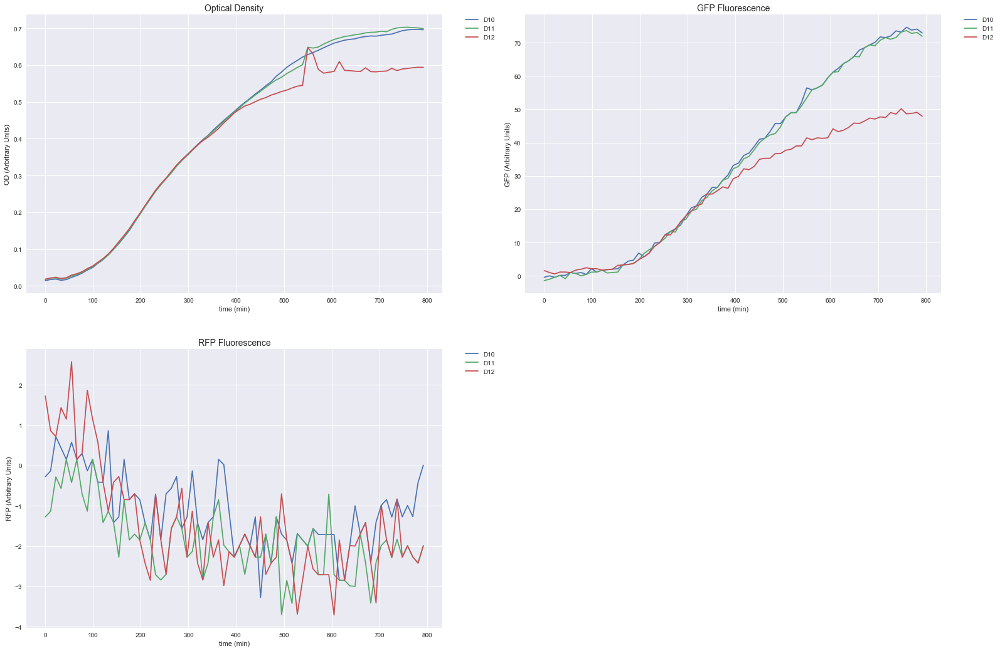

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>CTL11 // Top10 // No Plasmid // IPTG: 0.5 mM // Ara : 0 mM</span>

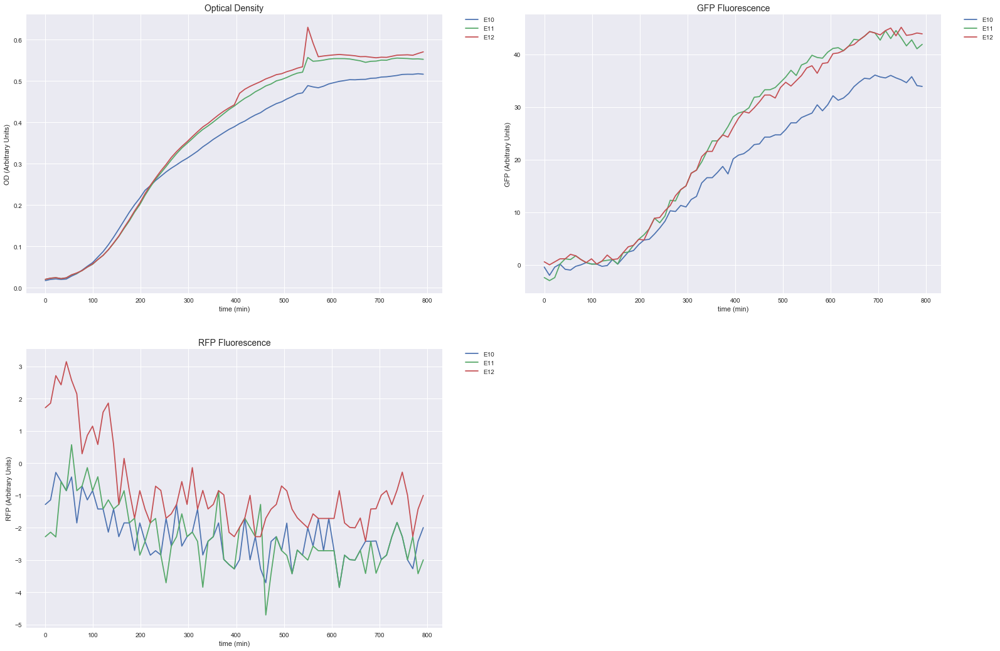

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>CTL12 // Top10 // No Plasmid // IPTG: 0.0 mM // Ara : 1 mM</span>

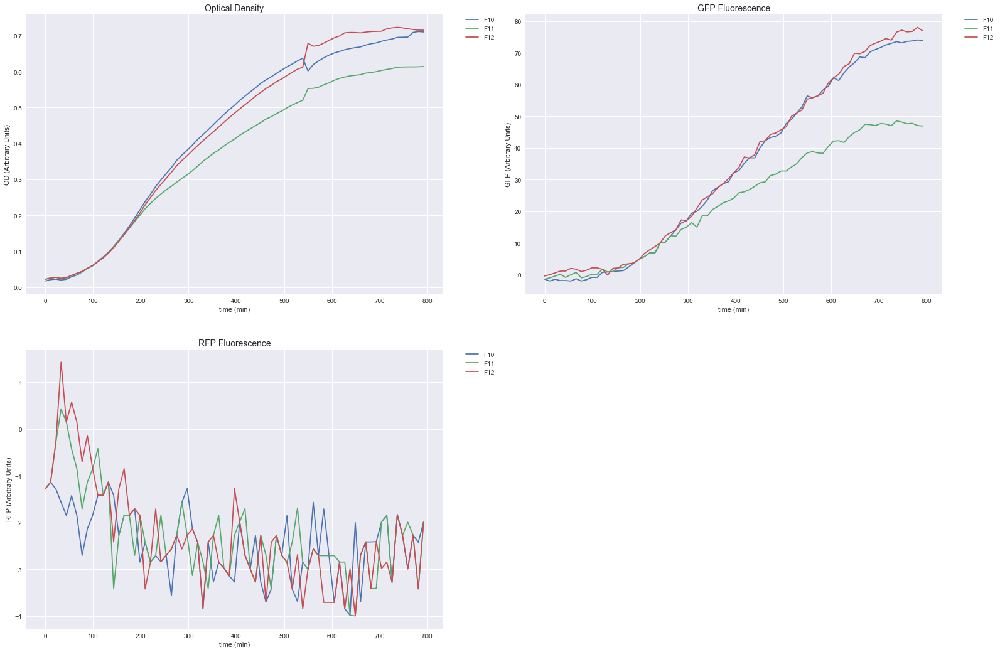

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:200%;font-weight:900'><br>Strain : ∆lacI∆araC</span>

<div style='background-color:#4682B4;width:100%;height:20px;'></div>

<span style='font-size:200%;font-weight:900'><br> ∆lacI∆araC -  pECJ3B + pZA16mflon</span>

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>SPL4 // ∆lacI∆araC //  pECJ3B + pZA16mflon // IPTG: 0.0 mM // Ara : 0 mM</span>

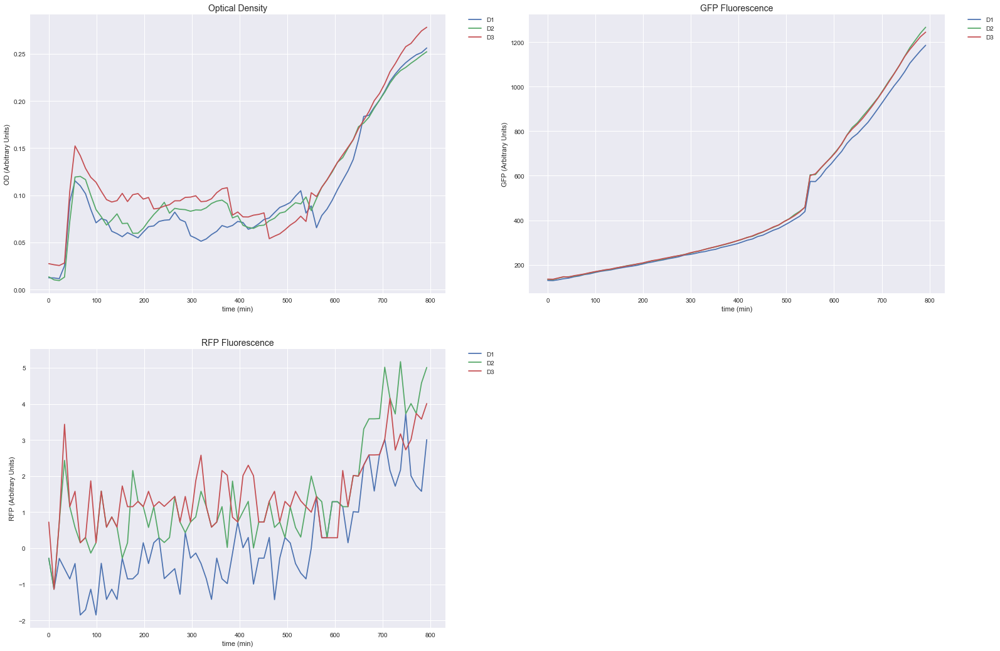

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>SPL5 // ∆lacI∆araC //  pECJ3B + pZA16mflon // IPTG: 0.5 mM // Ara : 0 mM</span>

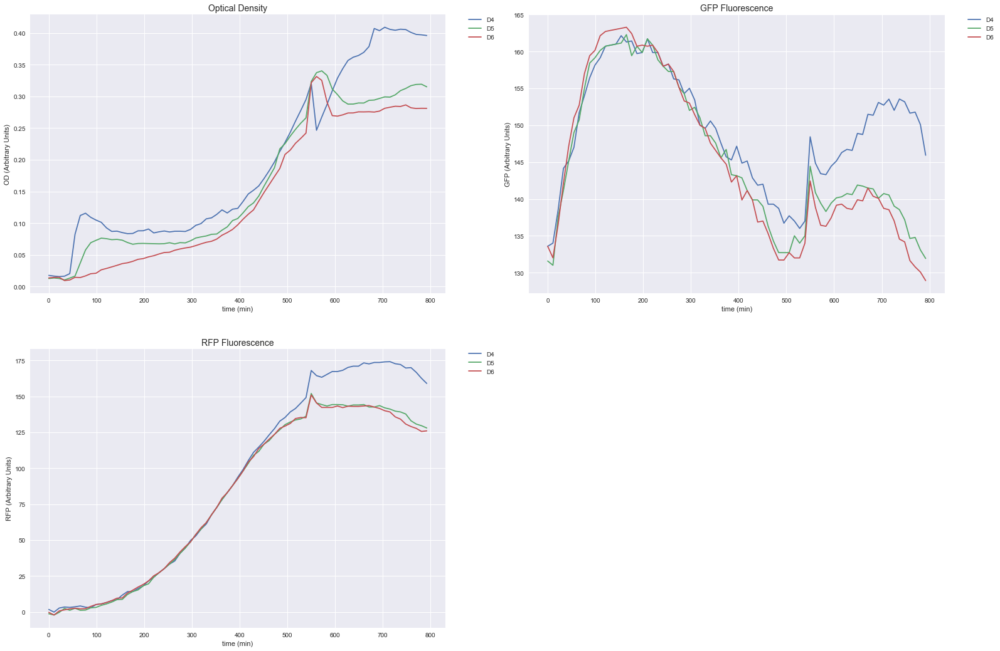

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>SPL6 // ∆lacI∆araC //  pECJ3B + pZA16mflon // IPTG: 0.0 mM // Ara : 1 mM</span>

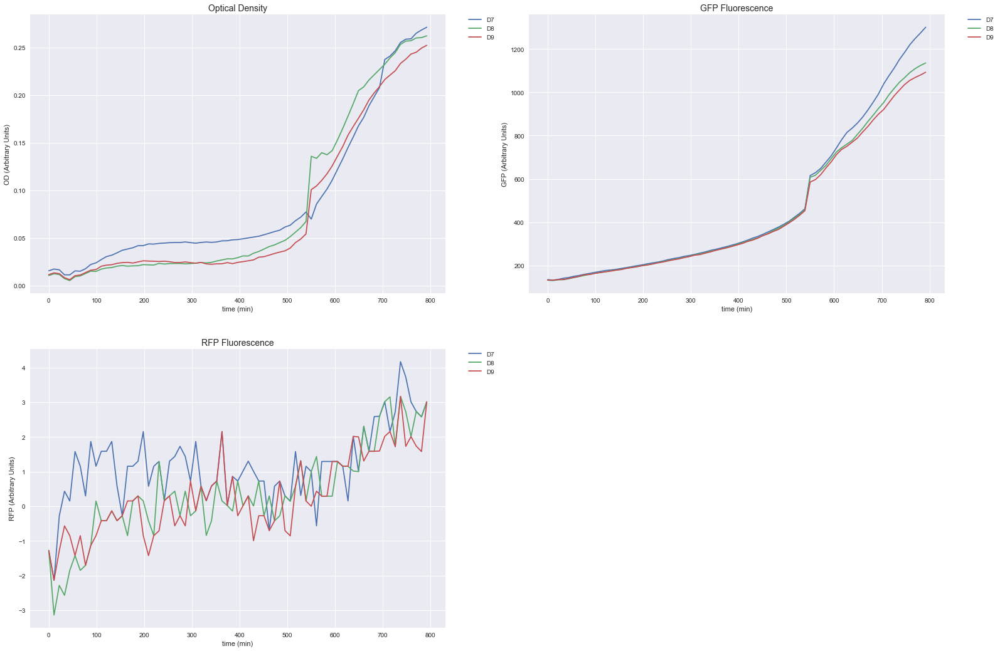

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:200%;font-weight:900'><br> ∆lacI∆araC - pECJ3 + pZA16mflon</span>

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>SPL1 // ∆lacI∆araC // pECJ3 + pZA16mflon // IPTG: 0.0 mM // Ara : 0 mM</span>

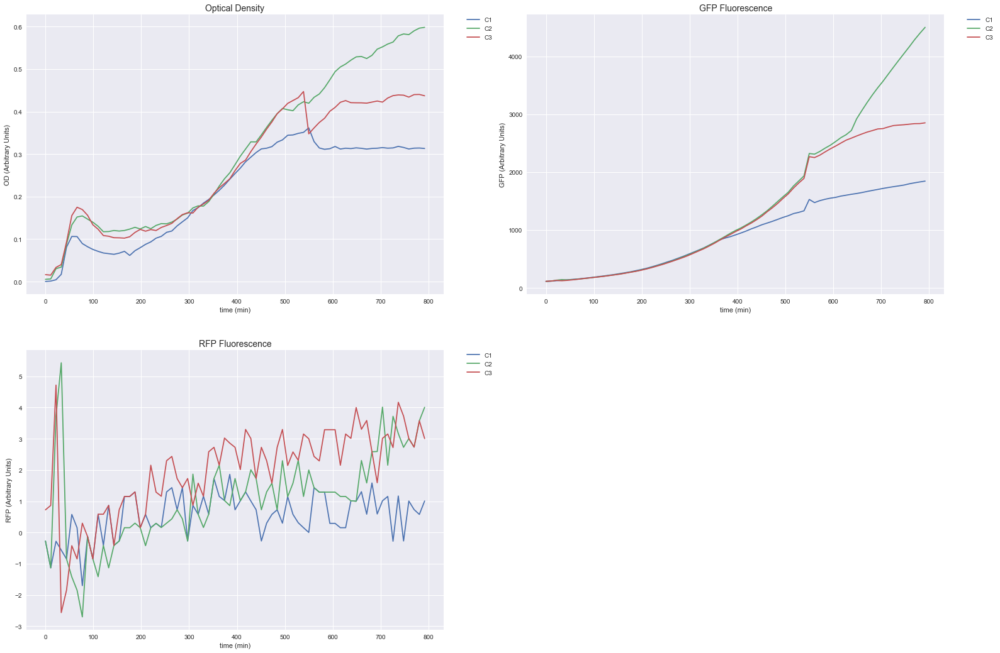

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>SPL2 // ∆lacI∆araC // pECJ3 + pZA16mflon // IPTG: 0.5 mM // Ara : 0 mM</span>

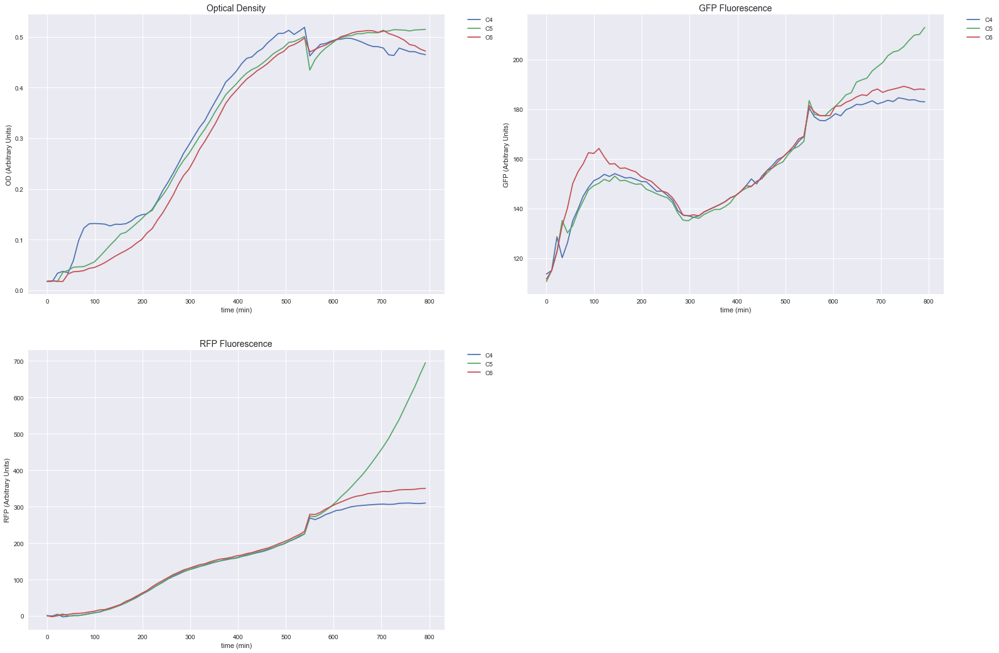

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>SPL3 // ∆lacI∆araC // pECJ3 + pZA16mflon // IPTG: 0.0 mM // Ara : 1 mM</span>

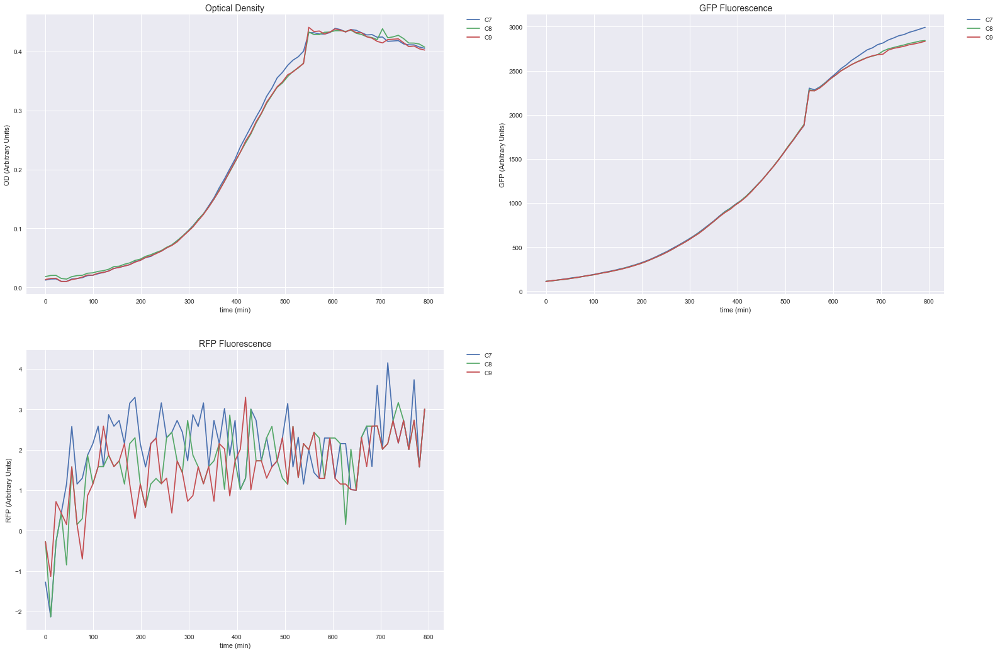

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:200%;font-weight:900'><br> ∆lacI∆araC - pECJ3D + pZA16mflo</span>

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>SPL7 // ∆lacI∆araC // pECJ3D + pZA16mflo // IPTG: 0.0 mM // Ara : 0 mM</span>

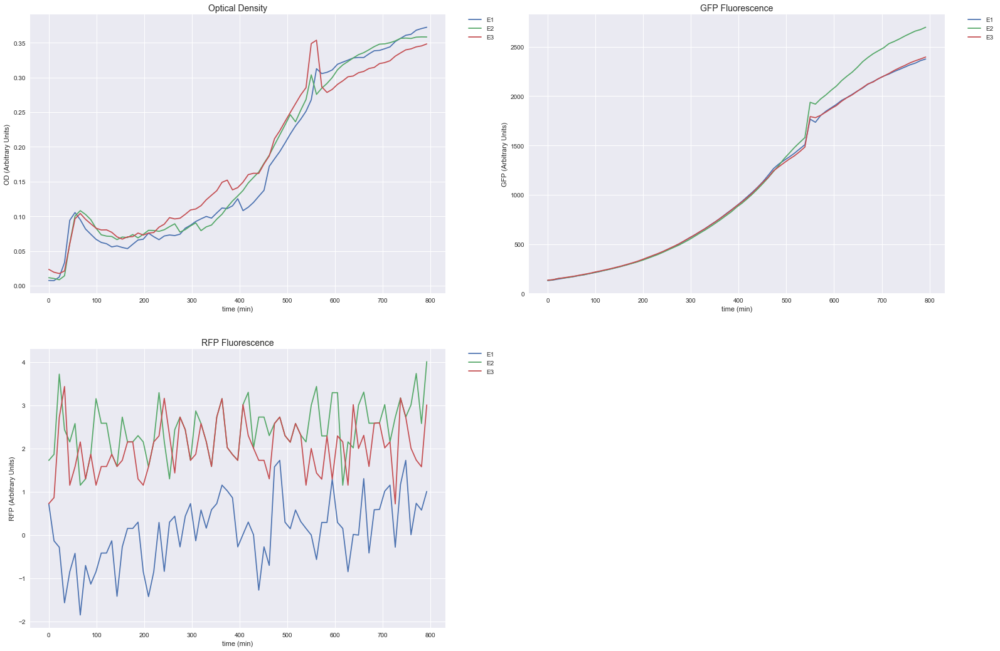

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>SPL8 // ∆lacI∆araC // pECJ3D + pZA16mflo // IPTG: 0.5 mM // Ara : 0 mM</span>

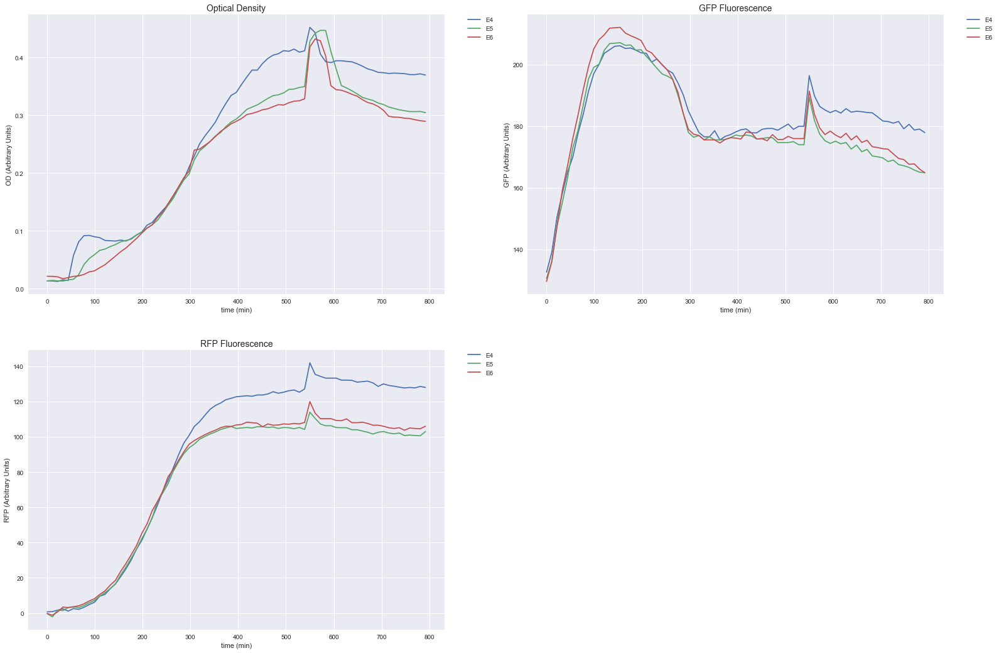

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>SPL9 // ∆lacI∆araC // pECJ3D + pZA16mflo // IPTG: 0.0 mM // Ara : 1 mM</span>

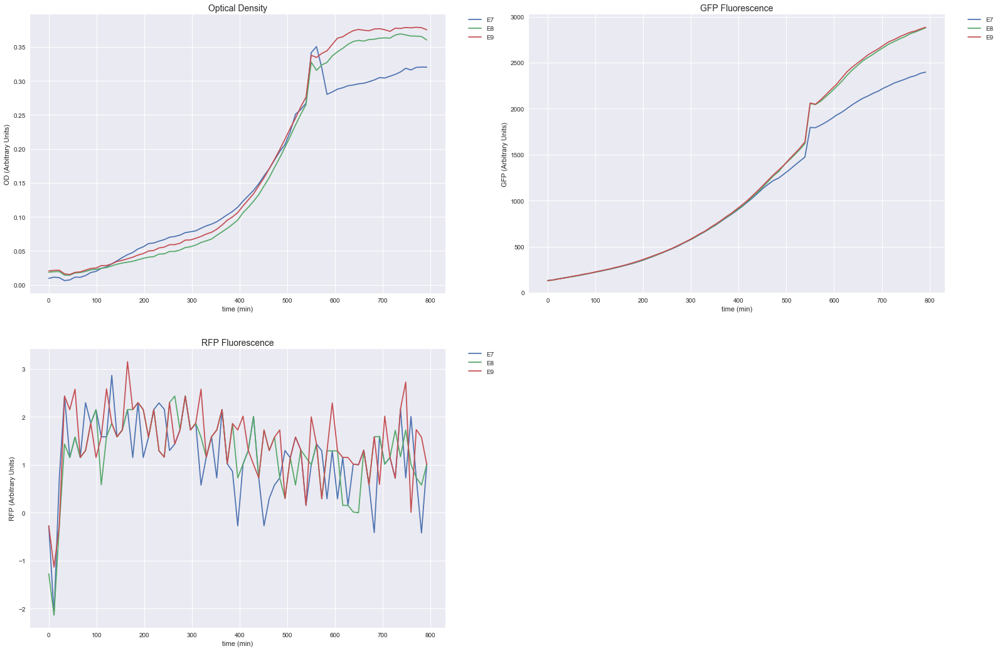

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

In [13]:
printmd("<span style='font-size:200%;font-weight:900'><br>Plotting the (Corrected) Experiments</span>")
printmd("<div style='background-color:#4682B4;width:100%;height:20px;'></div>")
    
all_strains = np.unique([exp['Strain'] for exp in non_controls])
all_strains.sort()
# the plasmid options depend on the strains so we will do the splicing in the loop...

for strain in all_strains:
    
    printmd("<span style='font-size:200%;font-weight:900'><br>Strain : {}</span>".format(strain))
    printmd("<div style='background-color:#4682B4;width:100%;height:20px;'></div>")

    associated_plasmids = np.unique([exp['Plasmid'] for exp in non_controls if exp['Strain'] == strain])
    associated_plasmids.sort()
    
    for plasmid in associated_plasmids:
        printmd("<span style='font-size:200%;font-weight:900'><br> {} - {}</span>".format(strain,plasmid))
        printmd("<div style='background-color:#4682B4;width:100%;height:10px;'></div>")
        
        # We now retrieve the corresponding exp and rank them / iptg
        # after that we retrieve the wells and display (we could have a deeper tree by splitting / inducers)
        # But this will be good enough
        
        associated_exps = [exp for exp in non_controls if exp['Strain'] == strain and exp['Plasmid'] == plasmid]
    
        for exp in associated_exps:
            # from mask we retrieve the corresponding wells
            sub_frame = mask_data[mask_data['Name'] == exp['Name']]
            wells = [x[0]+str(x[1]) for x in zip(sub_frame['Row'],sub_frame['Col'])]

            time = corrected_OD_data[(corrected_OD_data['Time']>=t_min) & (corrected_OD_data['Time']<=t_max)]['Time']
            all_ODs = np.array(corrected_OD_data[(corrected_OD_data['Time']>=t_min) & (corrected_OD_data['Time']<=t_max)][wells])
            all_GFPs = np.array(corrected_GFP_data[(corrected_GFP_data['Time']>=t_min) & (corrected_GFP_data['Time']<=t_max)][wells])
            all_RFPs = np.array(corrected_RFP_data[(corrected_RFP_data['Time']>=t_min) & (corrected_RFP_data['Time']<=t_max)][wells])
    
            #geo_mean_OD = mstats.gmean(all_ODs,axis=1) 
            #geo_mean_GFP = mstats.gmean(all_GFPs,axis=1)    
            #geo_mean_RFP = mstats.gmean(all_RFPs,axis=1) 

            fig = plt.figure(figsize=(18,18))
            ax = fig.add_subplot(221)
            ax2 = fig.add_subplot(222)
            ax3 = fig.add_subplot(223)
            for well in wells:
                ax.plot(time, corrected_OD_data[(corrected_OD_data['Time']>=t_min) & (corrected_OD_data['Time']<=t_max)][well],label = well)


            #ax.plot(time, geo_mean_OD,lw=4,label = 'geo mean')    

            ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
            ax.set_title("Optical Density", fontsize=14)   
            ax.set_xlabel('time (min)')
            ax.set_ylabel('OD (Arbitrary Units)')

            for well in wells:
                ax2.plot(time, corrected_GFP_data[(corrected_GFP_data['Time']>=t_min) & (corrected_GFP_data['Time']<=t_max)][well],label = well)

            #ax2.plot(time, geo_mean_GFP,lw=4,label = 'geo mean')    
            ax2.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
            ax2.set_title("GFP Fluorescence", fontsize=14)   
            ax2.set_xlabel('time (min)')
            ax2.set_ylabel('GFP (Arbitrary Units)')

            for well in wells:
                ax3.plot(time, corrected_RFP_data[(corrected_RFP_data['Time']>=t_min) & (corrected_RFP_data['Time']<=t_max)][well],label = well)

            #ax3.plot(time, geo_mean_RFP,lw=4,label = 'geo mean')    
            ax3.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
            ax3.set_title("RFP Fluorescence", fontsize=14)   
            ax3.set_xlabel('time (min)')
            ax3.set_ylabel('RFP (Arbitrary Units)')

            plt.subplots_adjust(left=None, bottom=None, right=1.25, top=None,
                        wspace=None, hspace=None)   
            printmd("<span style='font-size:180%;font-weight:900;color:#4169E1'><br>{} // {} // {} // IPTG: {} mM // Ara : {} mM</span>"
                    .format(exp['Name'],exp['Strain'],exp['Plasmid'],exp['IPTG'],exp['Ara']))
            plt.show()                
            printmd("<div style='background-color:#4682B4;width:100%;height:10px;'></div>")

## Final Step - Estimating the Internal Concentrations 

In [19]:
# So it looks like some time intervals are no good
# 500+ for instance 
# So let's plot the ratio only for the values in between

display_t_min = 120
display_t_max = 500

# estimation_t_min = 150
# estimation_t_max = 300

<span style='font-size:200%;font-weight:900'><br>Plotting the (Corrected) Experiments</span>

<div style='background-color:#4682B4;width:100%;height:20px;'></div>

<span style='font-size:200%;font-weight:900'><br>Strain : BL21</span>

<div style='background-color:#4682B4;width:100%;height:20px;'></div>

<span style='font-size:200%;font-weight:900'><br> BL21 - No Plasmid</span>

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>CTL7 // BL21 // No Plasmid // IPTG: 0.0 mM // Ara : 0 mM</span>

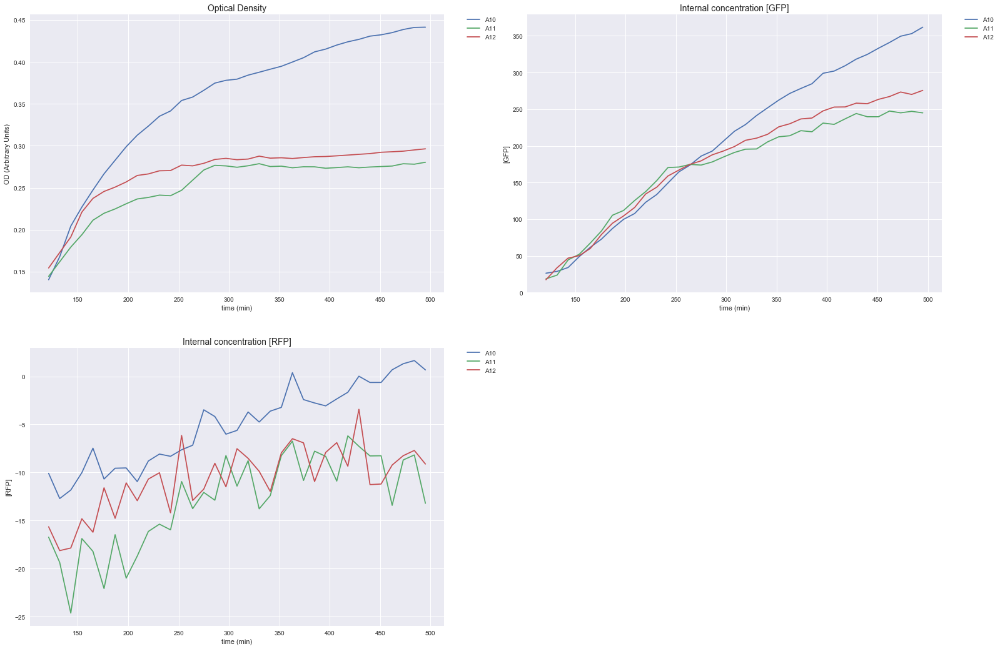

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>CTL8 // BL21 // No Plasmid // IPTG: 0.5 mM // Ara : 0 mM</span>

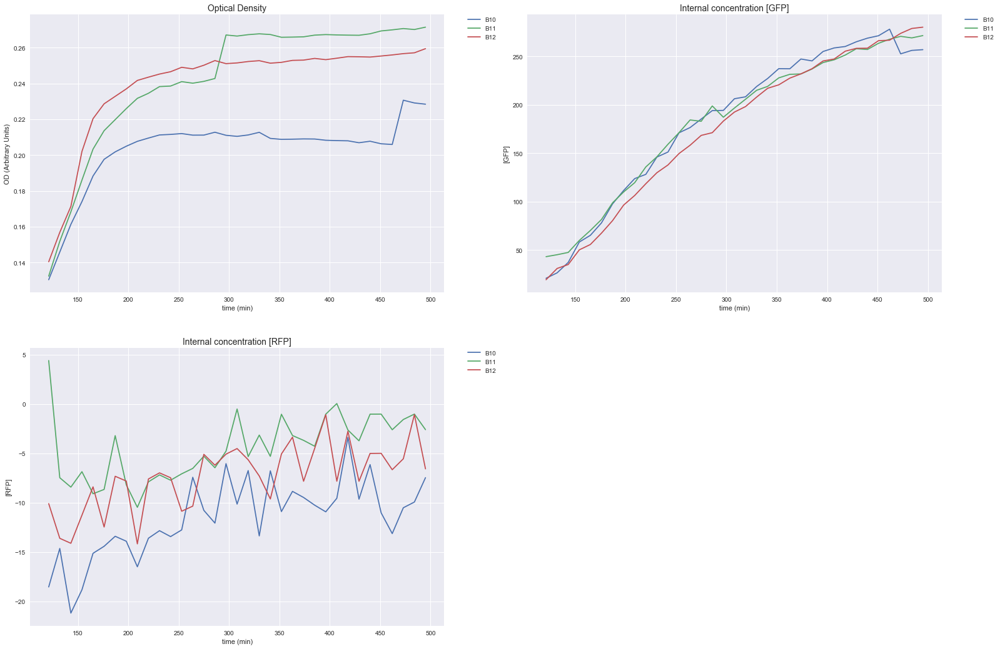

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>CTL9 // BL21 // No Plasmid // IPTG: 0.0 mM // Ara : 1 mM</span>

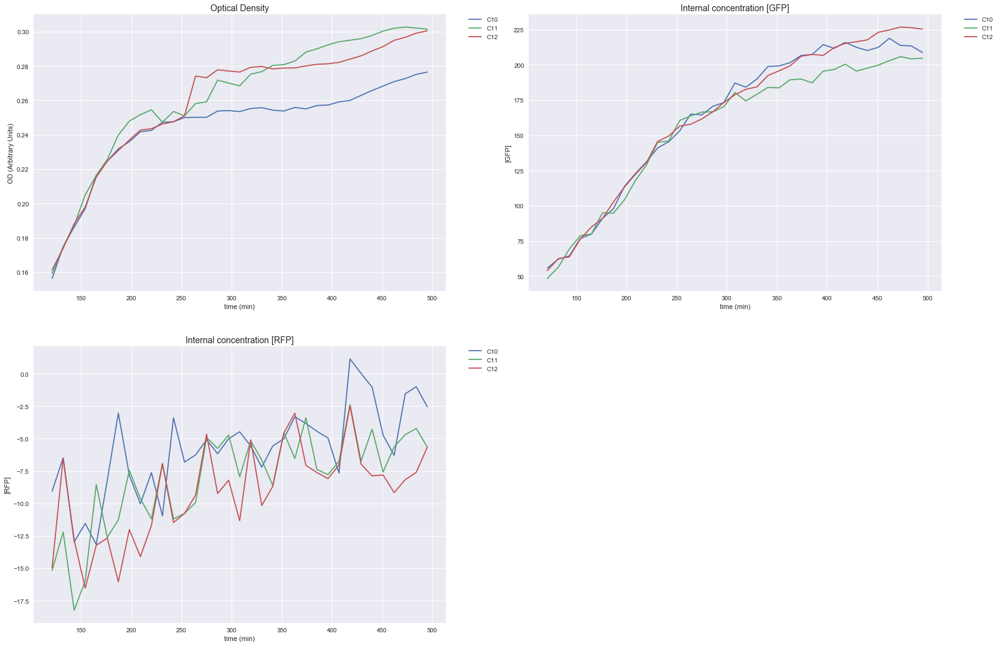

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:200%;font-weight:900'><br> BL21 - pECJ3 + pZA16mflon</span>

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>SPL10 // BL21 // pECJ3 + pZA16mflon // IPTG: 0.0 mM // Ara : 0 mM</span>

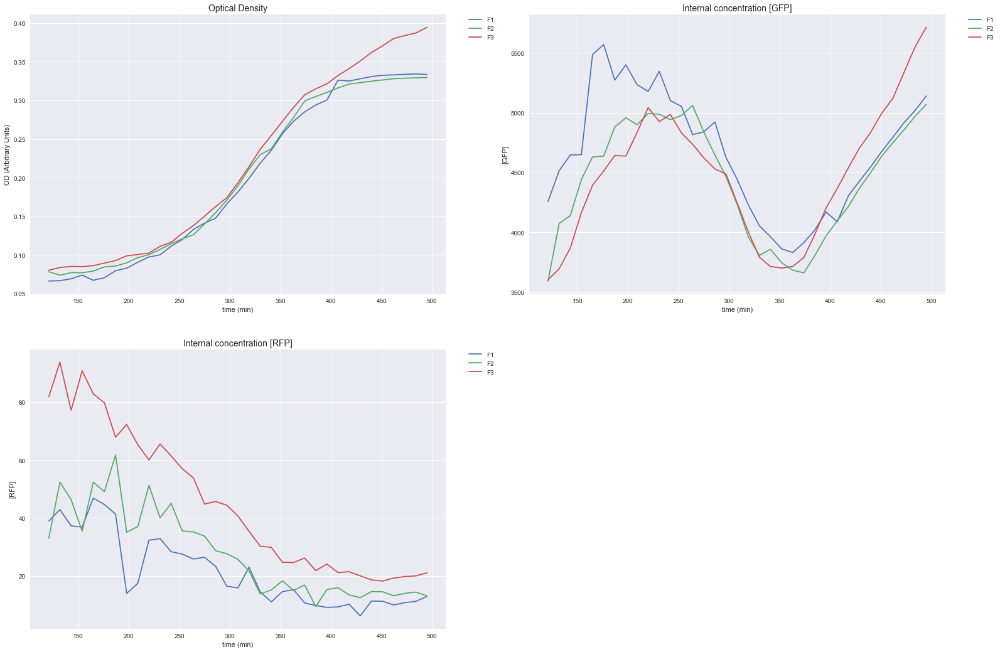

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>SPL11 // BL21 // pECJ3 + pZA16mflon // IPTG: 0.5 mM // Ara : 0 mM</span>

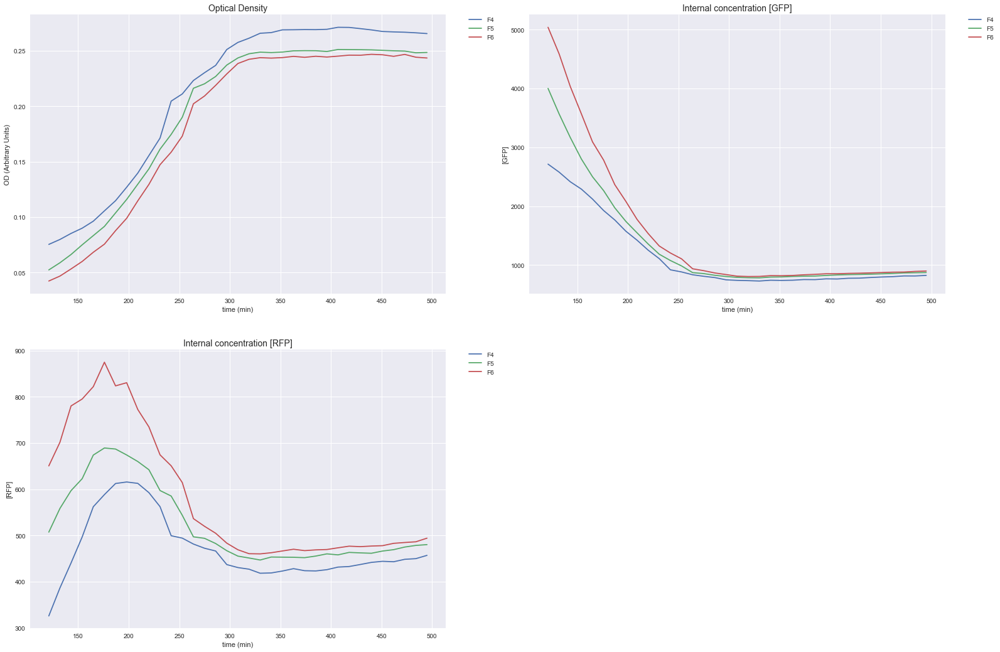

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>SPL12 // BL21 // pECJ3 + pZA16mflon // IPTG: 0.0 mM // Ara : 1 mM</span>

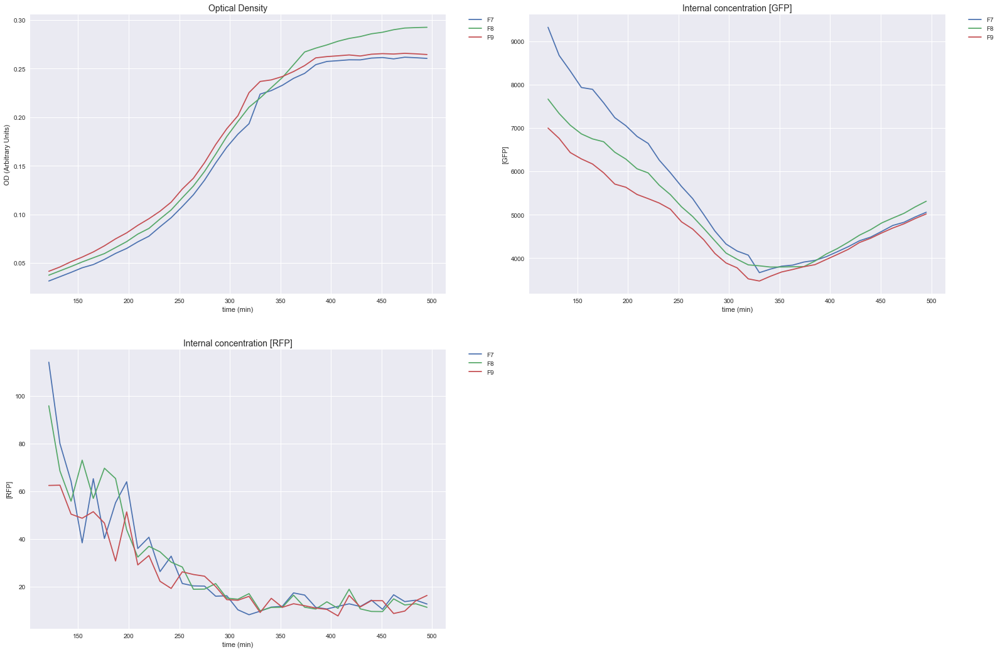

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:200%;font-weight:900'><br> BL21 - pECJ3D + pZA16mflon</span>

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>SPL13 // BL21 // pECJ3D + pZA16mflon // IPTG: 0.0 mM // Ara : 0 mM</span>

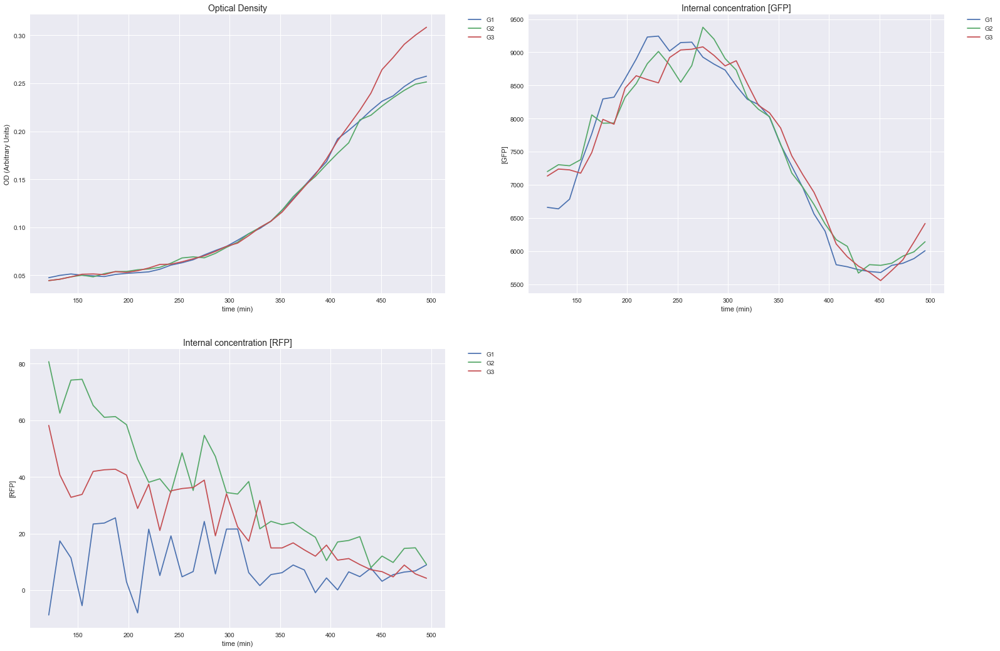

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>SPL14 // BL21 // pECJ3D + pZA16mflon // IPTG: 0.5 mM // Ara : 0 mM</span>

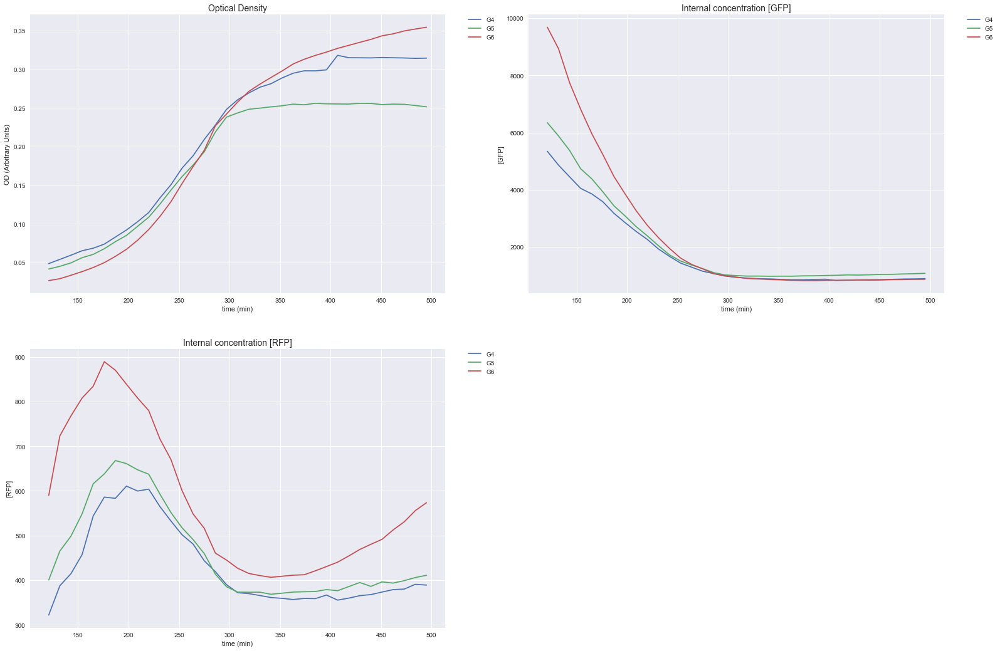

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>SPL15 // BL21 // pECJ3D + pZA16mflon // IPTG: 0.0 mM // Ara : 1 mM</span>

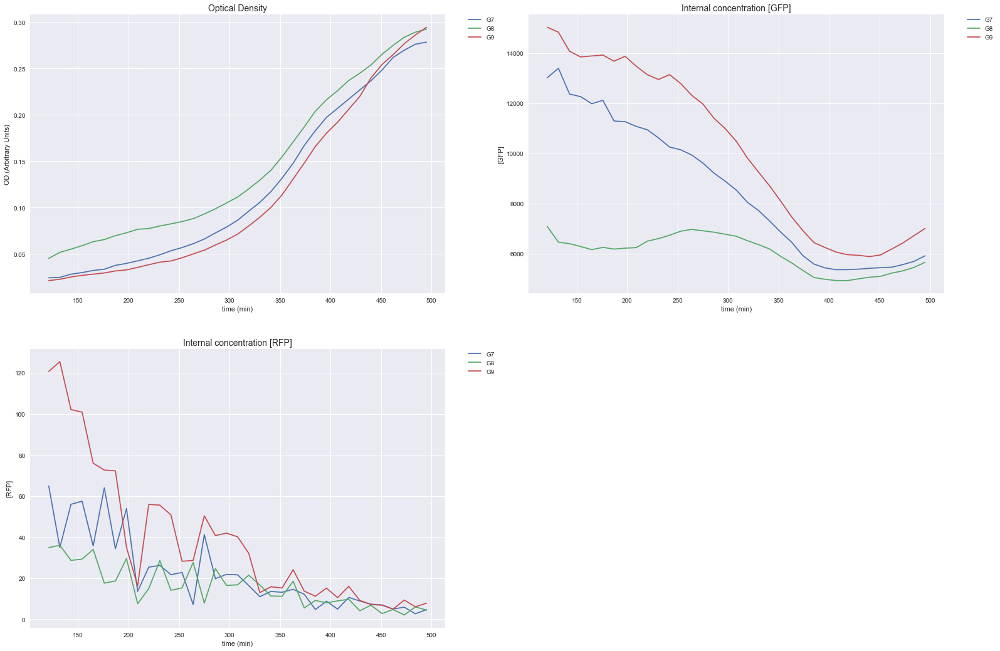

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:200%;font-weight:900'><br>Strain : DH5alpha</span>

<div style='background-color:#4682B4;width:100%;height:20px;'></div>

<span style='font-size:200%;font-weight:900'><br> DH5alpha - GFP+</span>

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>CTL1 // DH5alpha // GFP+ // IPTG: 0.0 mM // Ara : 0 mM</span>

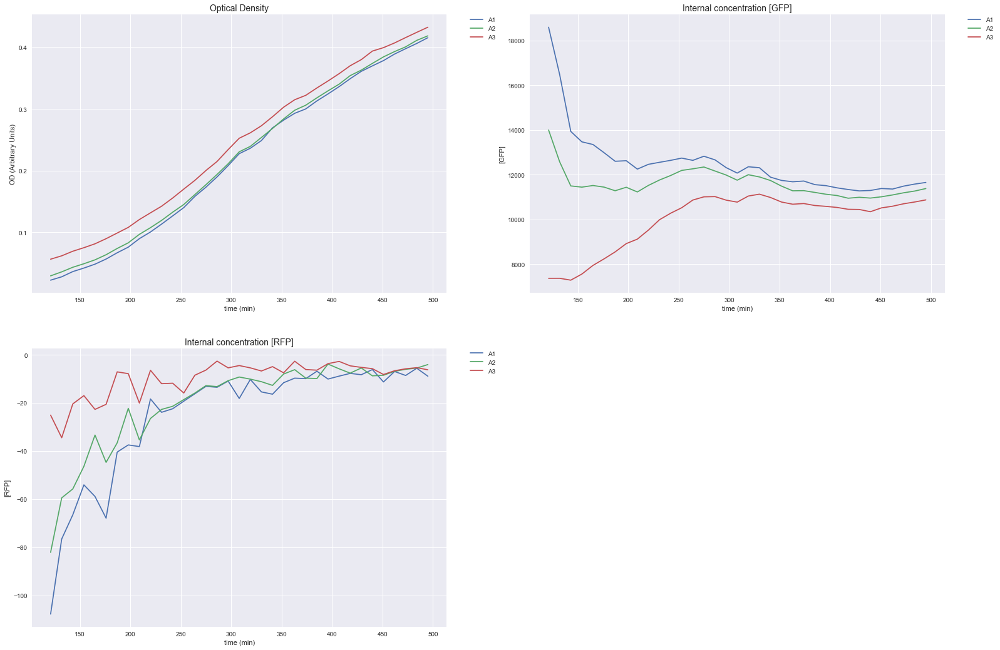

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>CTL2 // DH5alpha // GFP+ // IPTG: 0.5 mM // Ara : 0 mM</span>

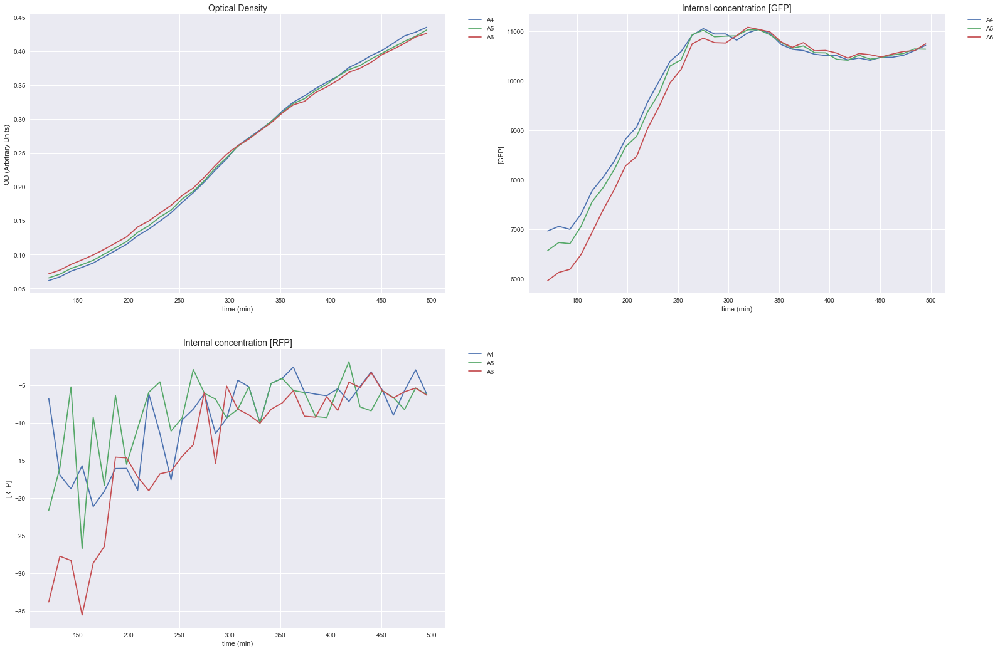

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>CTL3 // DH5alpha // GFP+ // IPTG: 0.0 mM // Ara : 1 mM</span>

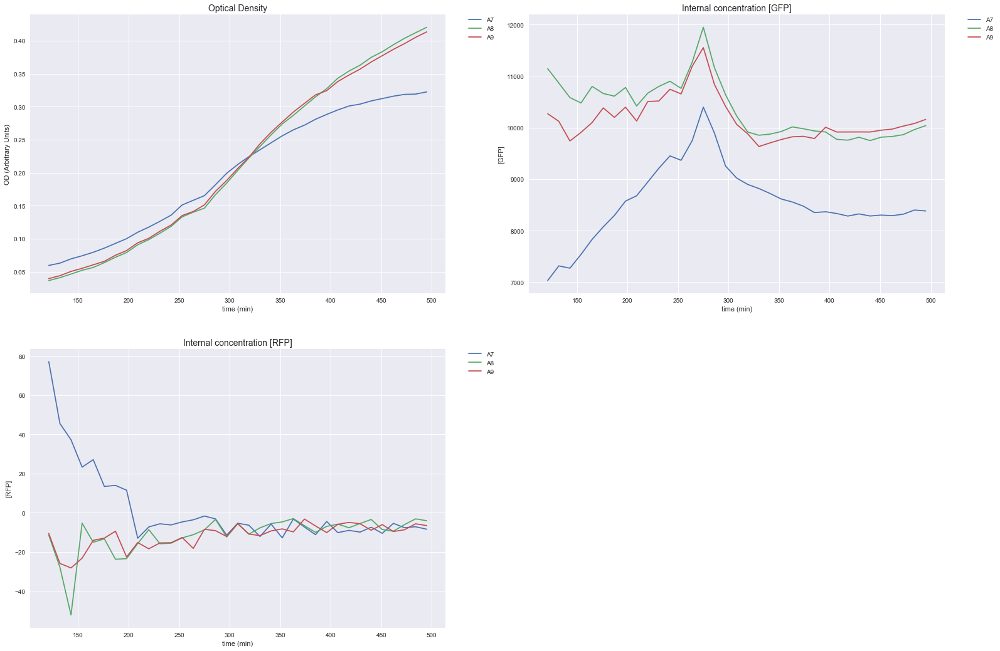

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:200%;font-weight:900'><br> DH5alpha - RFP+</span>

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>CTL4 // DH5alpha // RFP+ // IPTG: 0.0 mM // Ara : 0 mM</span>

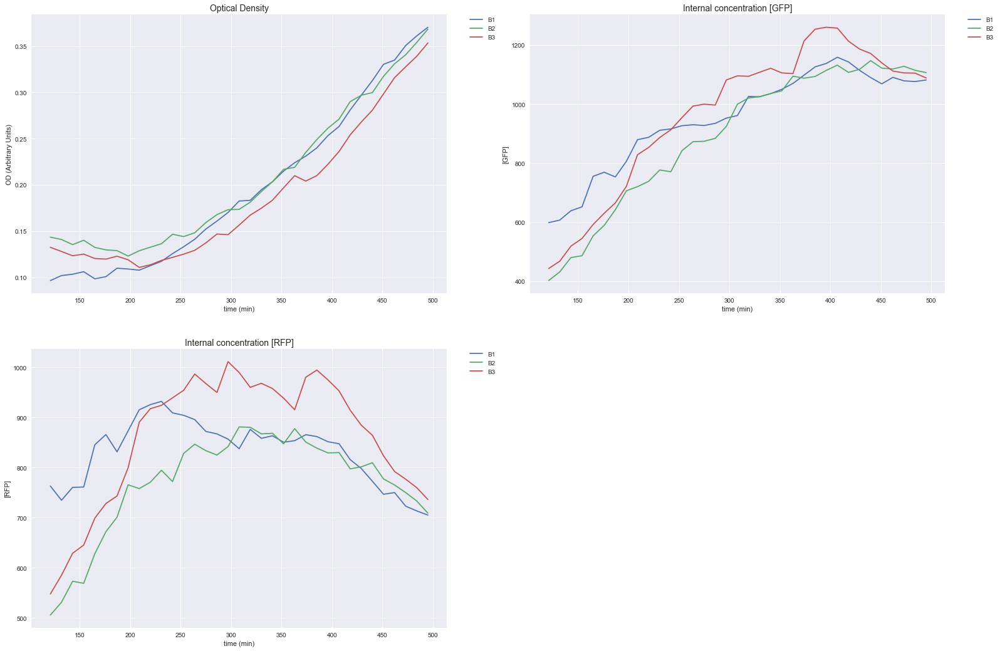

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>CTL5 // DH5alpha // RFP+ // IPTG: 0.5 mM // Ara : 0 mM</span>

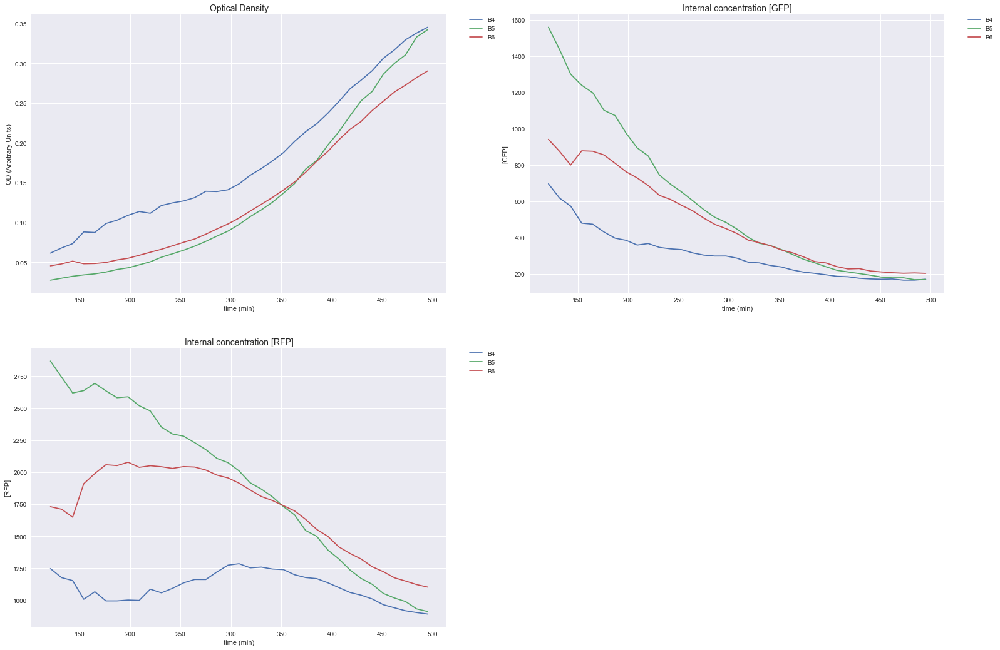

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>CTL6 // DH5alpha // RFP+ // IPTG: 0.0 mM // Ara : 1 mM</span>

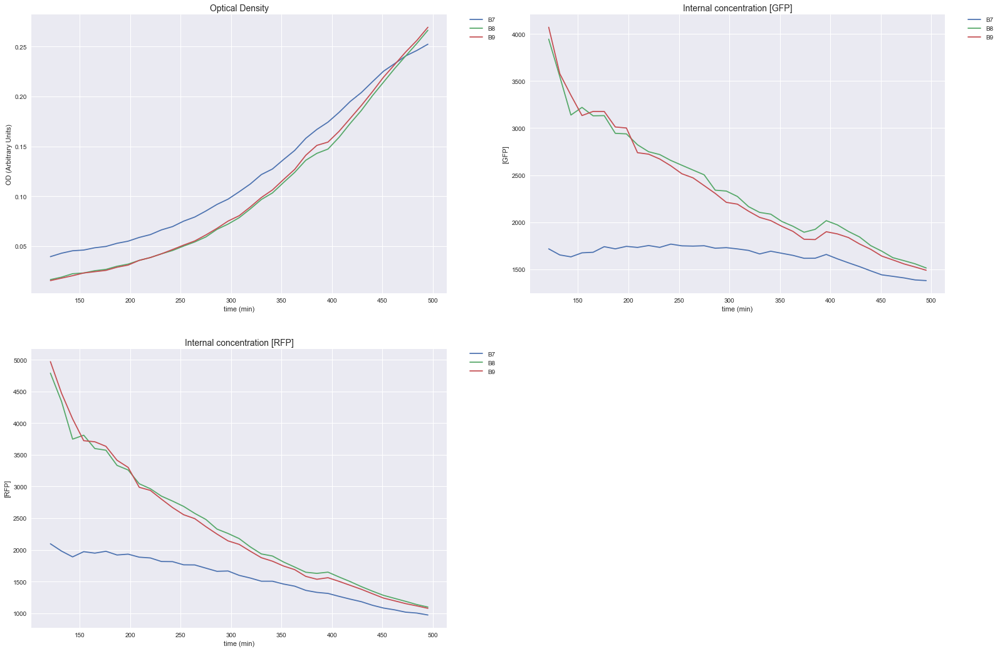

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:200%;font-weight:900'><br>Strain : Top10</span>

<div style='background-color:#4682B4;width:100%;height:20px;'></div>

<span style='font-size:200%;font-weight:900'><br> Top10 - No Plasmid</span>

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>CTL10 // Top10 // No Plasmid // IPTG: 0.0 mM // Ara : 0 mM</span>

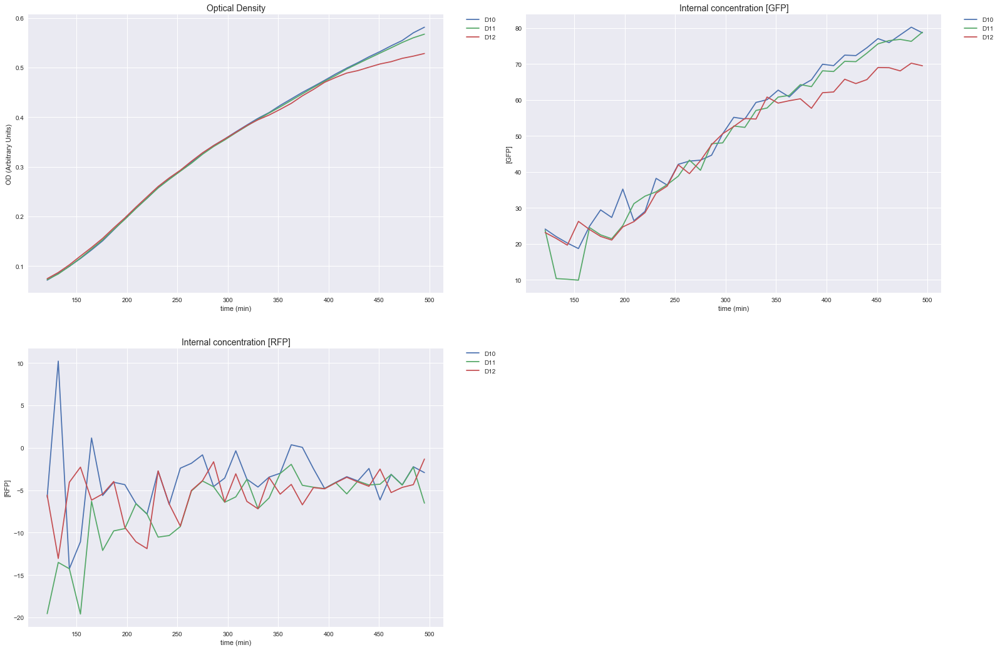

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>CTL11 // Top10 // No Plasmid // IPTG: 0.5 mM // Ara : 0 mM</span>

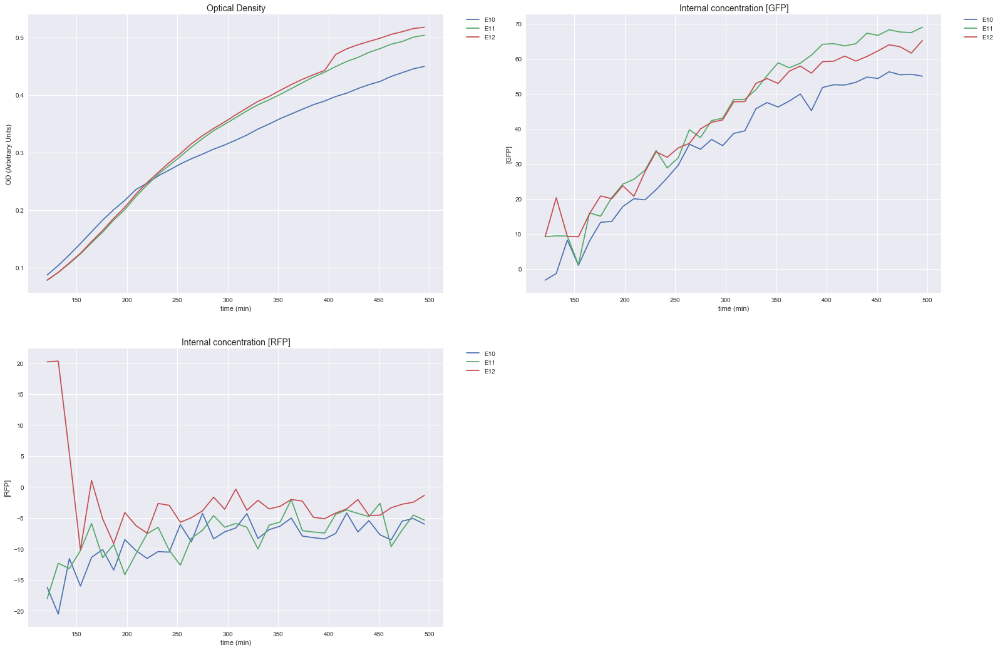

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>CTL12 // Top10 // No Plasmid // IPTG: 0.0 mM // Ara : 1 mM</span>

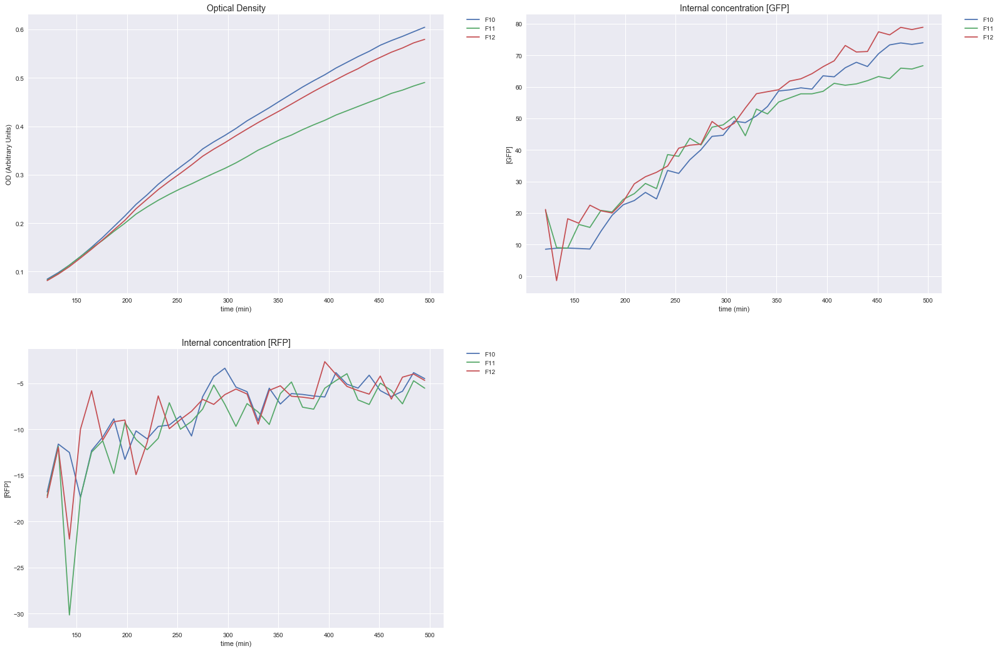

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:200%;font-weight:900'><br>Strain : ∆lacI∆araC</span>

<div style='background-color:#4682B4;width:100%;height:20px;'></div>

<span style='font-size:200%;font-weight:900'><br> ∆lacI∆araC -  pECJ3B + pZA16mflon</span>

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>SPL4 // ∆lacI∆araC //  pECJ3B + pZA16mflon // IPTG: 0.0 mM // Ara : 0 mM</span>

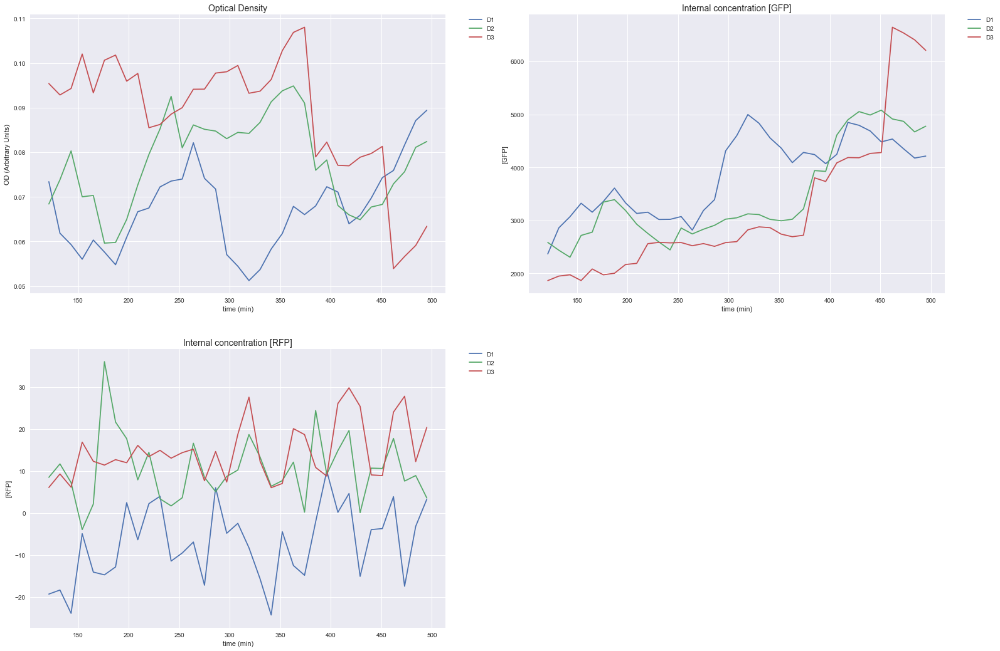

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>SPL5 // ∆lacI∆araC //  pECJ3B + pZA16mflon // IPTG: 0.5 mM // Ara : 0 mM</span>

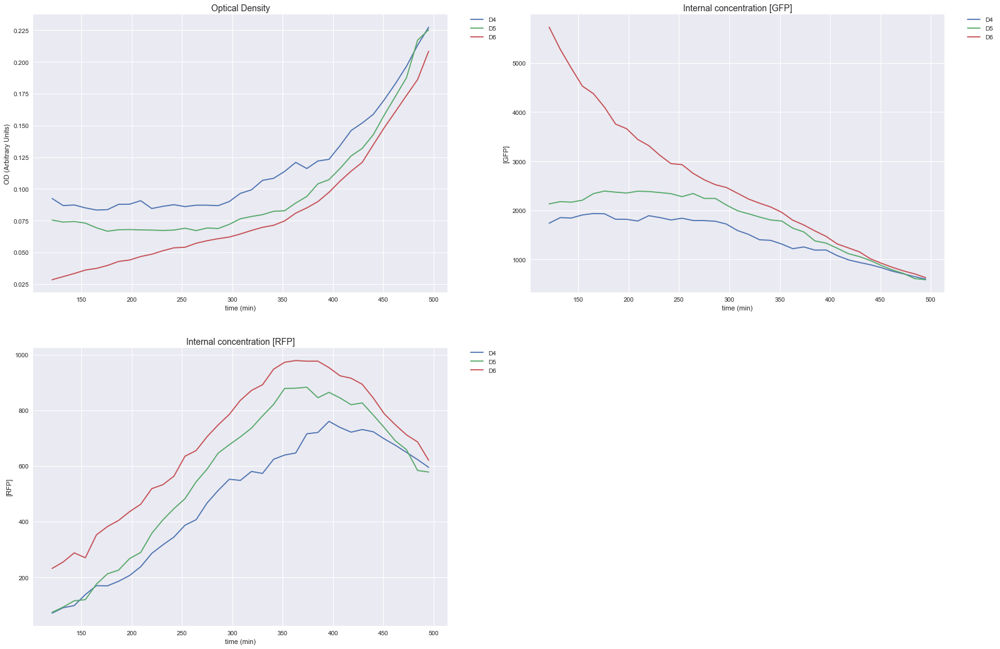

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>SPL6 // ∆lacI∆araC //  pECJ3B + pZA16mflon // IPTG: 0.0 mM // Ara : 1 mM</span>

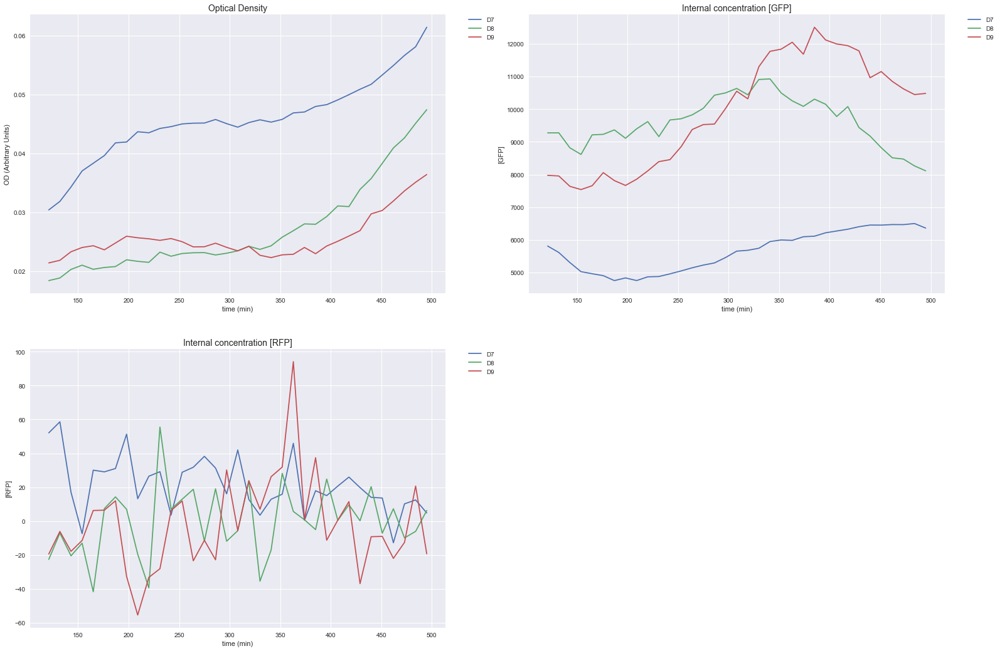

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:200%;font-weight:900'><br> ∆lacI∆araC - pECJ3 + pZA16mflon</span>

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>SPL1 // ∆lacI∆araC // pECJ3 + pZA16mflon // IPTG: 0.0 mM // Ara : 0 mM</span>

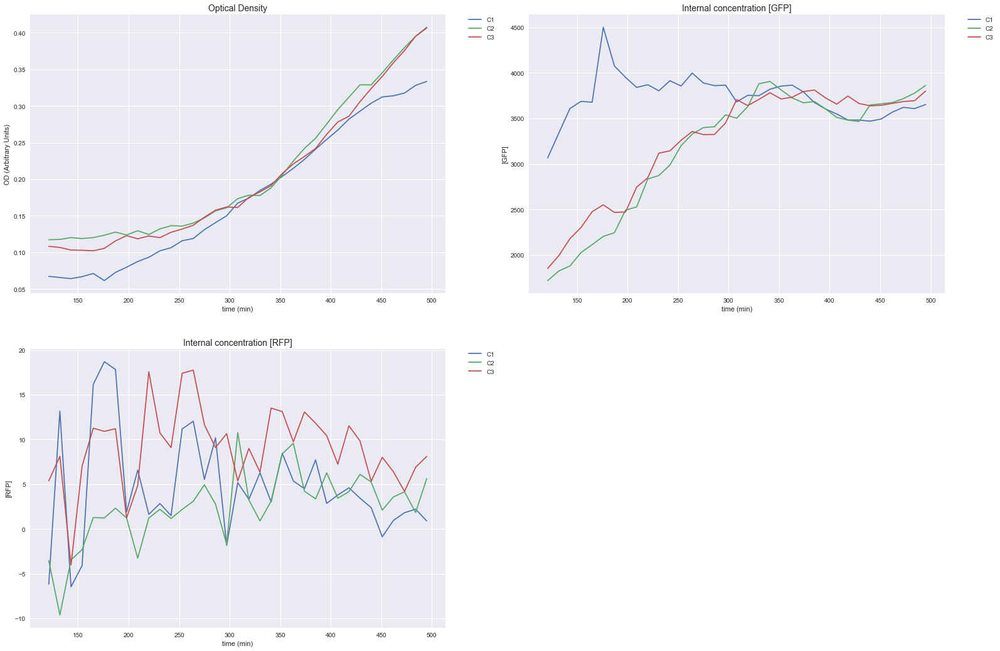

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>SPL2 // ∆lacI∆araC // pECJ3 + pZA16mflon // IPTG: 0.5 mM // Ara : 0 mM</span>

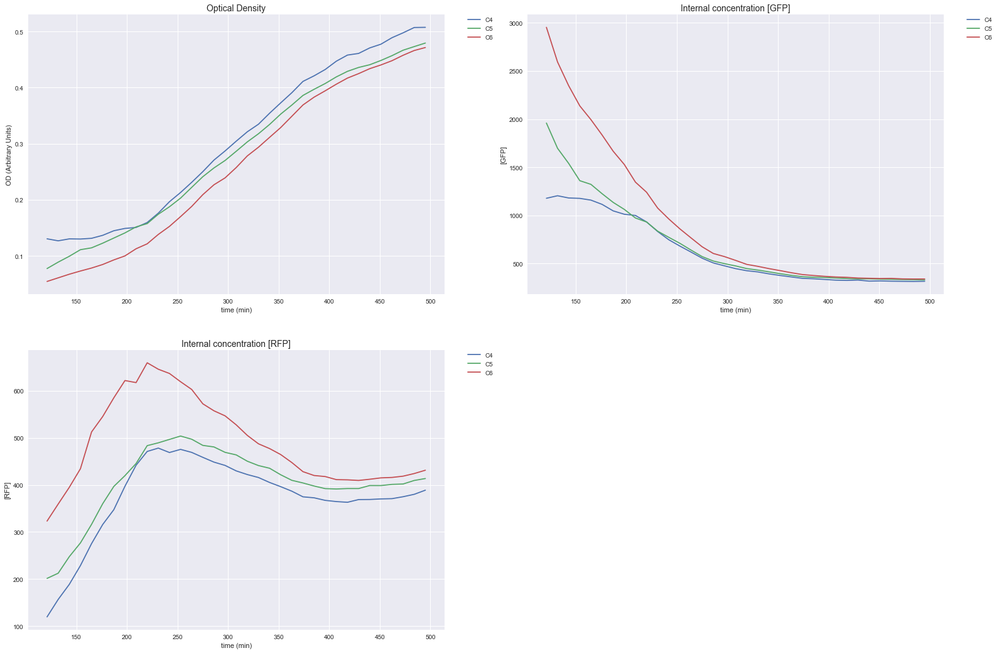

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>SPL3 // ∆lacI∆araC // pECJ3 + pZA16mflon // IPTG: 0.0 mM // Ara : 1 mM</span>

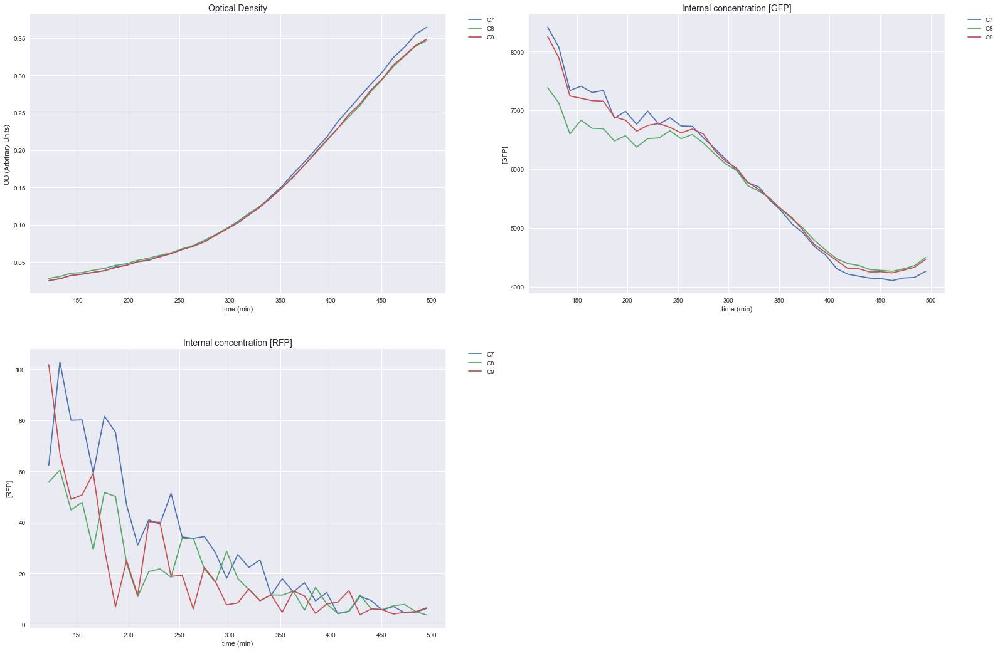

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:200%;font-weight:900'><br> ∆lacI∆araC - pECJ3D + pZA16mflo</span>

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>SPL7 // ∆lacI∆araC // pECJ3D + pZA16mflo // IPTG: 0.0 mM // Ara : 0 mM</span>

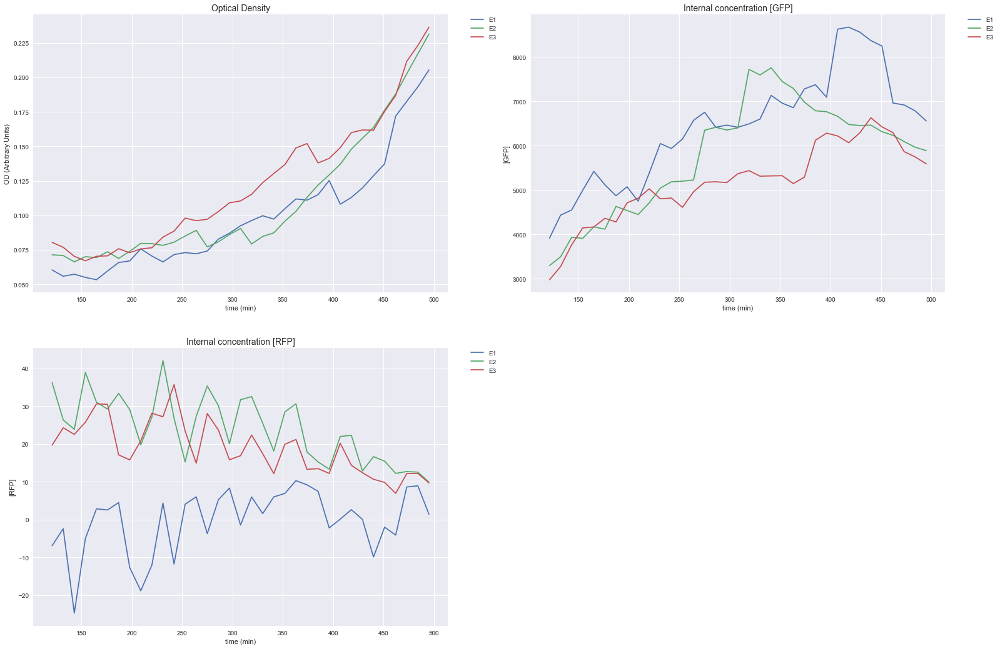

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>SPL8 // ∆lacI∆araC // pECJ3D + pZA16mflo // IPTG: 0.5 mM // Ara : 0 mM</span>

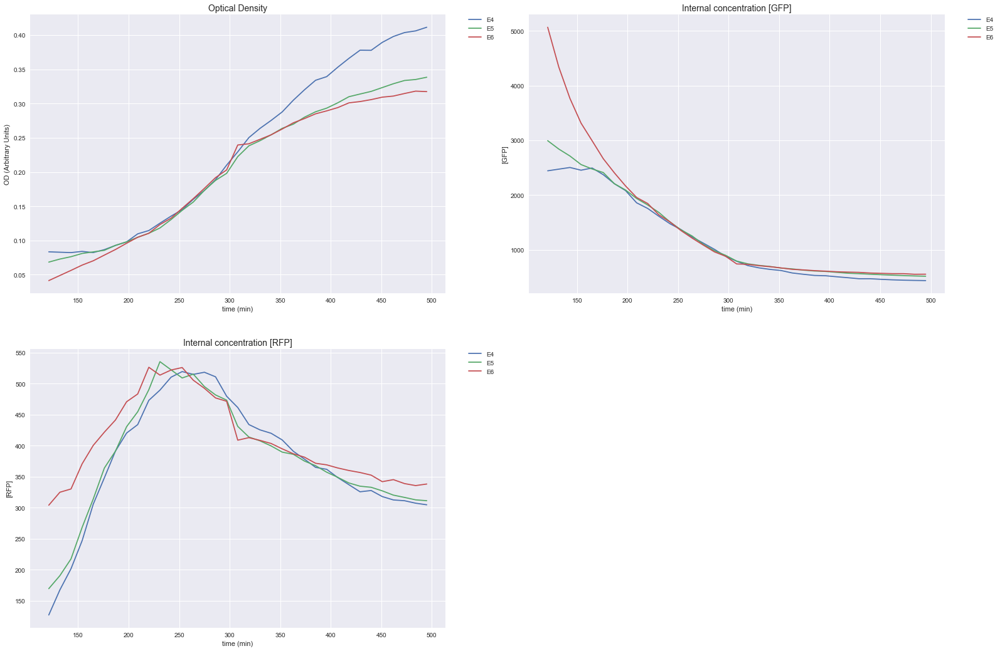

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

<span style='font-size:180%;font-weight:900;color:#4169E1'><br>SPL9 // ∆lacI∆araC // pECJ3D + pZA16mflo // IPTG: 0.0 mM // Ara : 1 mM</span>

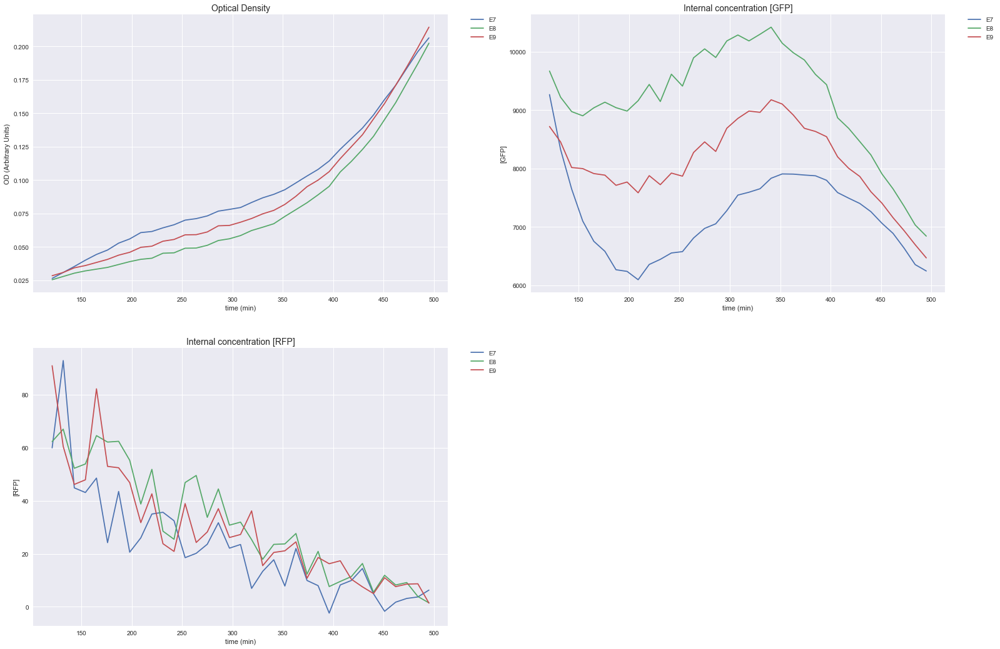

<div style='background-color:#4682B4;width:100%;height:10px;'></div>

In [20]:
printmd("<span style='font-size:200%;font-weight:900'><br>Plotting the (Corrected) Experiments</span>")
printmd("<div style='background-color:#4682B4;width:100%;height:20px;'></div>")
    
all_strains = np.unique([exp['Strain'] for exp in non_controls])
all_strains.sort()
# the plasmid options depend on the strains so we will do the splicing in the loop...

for strain in all_strains:
    
    printmd("<span style='font-size:200%;font-weight:900'><br>Strain : {}</span>".format(strain))
    printmd("<div style='background-color:#4682B4;width:100%;height:20px;'></div>")

    associated_plasmids = np.unique([exp['Plasmid'] for exp in non_controls if exp['Strain'] == strain])
    associated_plasmids.sort()
    
    for plasmid in associated_plasmids:
        printmd("<span style='font-size:200%;font-weight:900'><br> {} - {}</span>".format(strain,plasmid))
        printmd("<div style='background-color:#4682B4;width:100%;height:10px;'></div>")
        
        # We now retrieve the corresponding exp and rank them / iptg
        # after that we retrieve the wells and display (we could have a deeper tree by splitting / inducers)
        # But this will be good enough
        
        associated_exps = [exp for exp in non_controls if exp['Strain'] == strain and exp['Plasmid'] == plasmid]
    
        for exp in associated_exps:
            # from mask we retrieve the corresponding wells
            sub_frame = mask_data[mask_data['Name'] == exp['Name']]
            wells = [x[0]+str(x[1]) for x in zip(sub_frame['Row'],sub_frame['Col'])]

            time = corrected_OD_data[(corrected_OD_data['Time']>=display_t_min) & (corrected_OD_data['Time']<=display_t_max)]['Time']
#             all_ODs = np.array(corrected_OD_data[(corrected_OD_data['Time']>=display_t_min) & (corrected_OD_data['Time']<=display_t_max)][wells])
#             all_GFPs = np.array(corrected_GFP_data[(corrected_GFP_data['Time']>=display_t_min) & (corrected_GFP_data['Time']<=display_t_max)][wells])
#             all_RFPs = np.array(corrected_RFP_data[(corrected_RFP_data['Time']>=display_t_min) & (corrected_RFP_data['Time']<=display_t_max)][wells])
    

            fig = plt.figure(figsize=(18,18))
            ax = fig.add_subplot(221)
            ax2 = fig.add_subplot(222)
            ax3 = fig.add_subplot(223)
            for well in wells:
                ax.plot(time, corrected_OD_data[(corrected_OD_data['Time']>=display_t_min) & (corrected_OD_data['Time']<=display_t_max)][well],label = well)
 

            ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
            ax.set_title("Optical Density", fontsize=14)   
            ax.set_xlabel('time (min)')
            ax.set_ylabel('OD (Arbitrary Units)')

            for well in wells:
                od = corrected_OD_data[(corrected_OD_data['Time']>=display_t_min) & (corrected_OD_data['Time']<=display_t_max)][well]
                gfp = corrected_GFP_data[(corrected_GFP_data['Time']>=display_t_min) & (corrected_GFP_data['Time']<=display_t_max)][well]
                ax2.plot(time,gfp/od ,label = well)
            ax2.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
            ax2.set_title("Internal concentration [GFP]", fontsize=14)   
            ax2.set_xlabel('time (min)')
            ax2.set_ylabel('[GFP]')

            for well in wells:
                od = corrected_OD_data[(corrected_OD_data['Time']>=display_t_min) & (corrected_OD_data['Time']<=display_t_max)][well]
                rfp = corrected_RFP_data[(corrected_RFP_data['Time']>=display_t_min) & (corrected_RFP_data['Time']<=display_t_max)][well]
                ax3.plot(time,rfp/od ,label = well)
   
            ax3.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
            ax3.set_title("Internal concentration [RFP]", fontsize=14)   
            ax3.set_xlabel('time (min)')
            ax3.set_ylabel('[RFP]')
            

            plt.subplots_adjust(left=None, bottom=None, right=1.25, top=None,
                        wspace=None, hspace=None)   
            printmd("<span style='font-size:180%;font-weight:900;color:#4169E1'><br>{} // {} // {} // IPTG: {} mM // Ara : {} mM</span>"
                    .format(exp['Name'],exp['Strain'],exp['Plasmid'],exp['IPTG'],exp['Ara']))
            plt.show()                
            printmd("<div style='background-color:#4682B4;width:100%;height:10px;'></div>")

In [ ]:
printmd("<span style='font-size:200%;font-weight:900'><br>Analysing the non-RiboJ Group</span>")
printmd("<div style='background-color:#4682B4;width:100%;height:20px;'></div>")
    

for exp in non_riboJ:
    printmd("<div style='background-color:#4682B4;width:100%;height:10px;'></div>")
    
    estimates = []
    sub_frame = mask_data[mask_data['Name'] == exp['Name']]
    wells = [x[0]+str(x[1]) for x in zip(sub_frame['Row'],sub_frame['Col'])]

    time = corrected_OD_data[(corrected_OD_data['Time']>=display_t_min) & (corrected_OD_data['Time']<=display_t_max)]['Time']
    
    fig = plt.figure(figsize=(18,9))
    ax = fig.add_subplot(121)
    ax2 = fig.add_subplot(122)
    
    for well in wells:
        ax.plot(time, corrected_OD_data[(corrected_OD_data['Time']>=display_t_min) & (corrected_OD_data['Time']<=display_t_max)][well],label = well)
    ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    ax.set_title("Optical Density", fontsize=14)   
    ax.set_xlabel('time (min)')
    ax.set_ylabel('OD (Arbitrary Units)')

    for well in wells:
        od = corrected_OD_data[(OD_data['Time']>=display_t_min) & (OD_data['Time']<=display_t_max)][well]
        fl = corrected_FL_data[(OD_data['Time']>=display_t_min) & (OD_data['Time']<=display_t_max)][well]
        short_od = corrected_OD_data[(OD_data['Time']>=estimation_t_min) & (OD_data['Time']<=estimation_t_max)][well]
        short_fl = corrected_FL_data[(OD_data['Time']>=estimation_t_min) & (OD_data['Time']<=estimation_t_max)][well]   
        ss = mstats.gmean(short_fl/short_od,0)
        estimates.append(ss)
        ax2.plot(time, fl/od,label = well)
    ax2.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    ax2.set_title("GFP Fluorescence", fontsize=14)   
    ax2.set_xlabel('time (min)')
    ax2.set_ylabel('FL (Arbitrary Units)')
    
    printmd("<span style='font-size:180%;font-weight:900;color:#4169E1'><br>{}: with RiboJ // IPTG: {} mM // Ara : {} mM</span>"
                    .format(exp['Name'],exp['IPTG'],exp['Ara']))
               
    plt.show()      
    
    # Final Results
    print('Estimated Steady States are: ')
    for ss,well in zip(estimates,wells):
        print('Well {}: {}'.format(well,str(ss)))
    print('\nCorresponding for experiment {} to a geometric mean of: {}'.format(exp['Name'],mstats.gmean(estimates,0)))
    printmd("<div style='background-color:#4682B4;width:100%;height:10px;'></div>")

In [ ]:
printmd("<span style='font-size:200%;font-weight:900'><br>Analysing the RiboJ Group</span>")
printmd("<div style='background-color:#4682B4;width:100%;height:20px;'></div>")
    

for exp in riboJ:
    printmd("<div style='background-color:#4682B4;width:100%;height:10px;'></div>")
    
    estimates = []
    sub_frame = mask_data[mask_data['Name'] == exp['Name']]
    wells = [x[0]+str(x[1]) for x in zip(sub_frame['Row'],sub_frame['Col'])]

    time = corrected_OD_data[(corrected_OD_data['Time']>=display_t_min) & (corrected_OD_data['Time']<=display_t_max)]['Time']
    
    fig = plt.figure(figsize=(18,9))
    ax = fig.add_subplot(121)
    ax2 = fig.add_subplot(122)
    
    for well in wells:
        ax.plot(time, corrected_OD_data[(corrected_OD_data['Time']>=display_t_min) & (corrected_OD_data['Time']<=display_t_max)][well],label = well)
    ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    ax.set_title("Optical Density", fontsize=14)   
    ax.set_xlabel('time (min)')
    ax.set_ylabel('OD (Arbitrary Units)')

    for well in wells:
        od = corrected_OD_data[(OD_data['Time']>=display_t_min) & (OD_data['Time']<=display_t_max)][well]
        fl = corrected_FL_data[(OD_data['Time']>=display_t_min) & (OD_data['Time']<=display_t_max)][well]
        short_od = corrected_OD_data[(OD_data['Time']>=estimation_t_min) & (OD_data['Time']<=estimation_t_max)][well]
        short_fl = corrected_FL_data[(OD_data['Time']>=estimation_t_min) & (OD_data['Time']<=estimation_t_max)][well]   
        ss = mstats.gmean(short_fl/short_od,0)
        estimates.append(ss)
        ax2.plot(time, fl/od,label = well)
    ax2.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    ax2.set_title("GFP Fluorescence", fontsize=14)   
    ax2.set_xlabel('time (min)')
    ax2.set_ylabel('FL (Arbitrary Units)')
    
    printmd("<span style='font-size:180%;font-weight:900;color:#4169E1'><br>{}: with RiboJ // IPTG: {} mM // Ara : {} mM</span>"
                    .format(exp['Name'],exp['IPTG'],exp['Ara']))
               
    plt.show()      
    
    # Final Results
    print('Estimated Steady States are: ')
    for ss,well in zip(estimates,wells):
        print('Well {}: {}'.format(well,str(ss)))
    print('\nCorresponding for experiment {} to a geometric mean of: {}'.format(exp['Name'],mstats.gmean(estimates,0)))
    printmd("<div style='background-color:#4682B4;width:100%;height:10px;'></div>")

# I will leave the final step to you ...